In [ ]:
import gym
import tensorflow as tf
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt
import time
import pandas as pd
from gym import wrappers
from gym import spaces
import math
import random

In [ ]:
df=pd.read_csv("rlinputdata.csv", parse_dates=True)

In [ ]:
input= 190406142

In [ ]:
df_sort = df.iloc[(df['rate']-input).abs().argsort()[:1]]

In [ ]:
df_sort["total_rate"].values[0]

190406142

In [ ]:
if df_sort["total_rate"].values[0]==0:
    print("")

In [ ]:
df["rate"][0]

187020016

In [ ]:
math.isnan(12)

False

In [ ]:
df["util"].max()

35835480000

In [ ]:
df=pd.read_csv("rlinputdata.csv", parse_dates=True)


In [ ]:

  
# apply normalization techniques on Column 1
column1 = 'rate'
column1_max=df[column1].abs().max()
df[column1] = df[column1] /df[column1].abs().max()
  
# view normalized data
display(df)

,Date_and_Time,Session_Time,rate,total_rate,sequences,sent,lost,util,old_util,thpt,loss_rate
0,1/09/2016 17:26,[758142.316657],0.161902,187020016,1183423122-1183966762,375,0,6960478500,27841914,8628086,0
1,1/09/2016 17:26,[758142.418919],0.164833,190406142,1184335362-1184890778,383,0,7073798000,28295192,8725911,0
2,1/09/2016 17:26,[758142.524369],0.167788,193819470,1185247602-1185834042,405,0,7187824500,28751298,8796160,0
3,1/09/2016 17:26,[758142.626754],0.170766,197260288,1186184778-1186720546,370,0,7302566500,29210266,8428802,0
4,1/09/2016 17:26,[758142.728929],0.173769,200728272,1187072082-1187658522,405,0,7418012000,29672048,9255681,0
...,...,...,...,...,...,...,...,...,...,...,...
998,1/09/2016 18:15,[761103.279116],0.956318,1104687326,1679569442-1679570962,1,0,34423514000,137694056,100,0
999,1/09/2016 18:15,[761103.676627],0.112488,129940672,1897496407-1898175559,476,0,5015455750,20061823,7582348,0
1000,1/09/2016 18:15,[761113.066661],0.957362,1105893304,1679571618-1679573074,1,0,34457334000,137829336,155,0
1001,1/09/2016 18:16,[761122.680615],0.958430,1107127152,1679573154-1679574610,1,0,34491930000,137967720,152,0


In [ ]:
df[column1].describe()

count    1003.000000
mean        0.458446
std         0.331190
min         0.000407
25%         0.111375
50%         0.486040
75%         0.738393
max         1.000000
Name: rate, dtype: float64

In [ ]:
column1_max

1155146779

In [ ]:
column2 = 'util'
column2_max=df[column2].abs().max()
df[column2] = (df[column2] /df[column2].abs().max())
  
# view normalized data
display(df)

,Date_and_Time,Session_Time,rate,total_rate,sequences,sent,lost,util,old_util,thpt,loss_rate
0,1/09/2016 17:26,[758142.316657],0.161902,187020016,1183423122-1183966762,375,0,0.194234,27841914,8628086,0
1,1/09/2016 17:26,[758142.418919],0.164833,190406142,1184335362-1184890778,383,0,0.197396,28295192,8725911,0
2,1/09/2016 17:26,[758142.524369],0.167788,193819470,1185247602-1185834042,405,0,0.200578,28751298,8796160,0
3,1/09/2016 17:26,[758142.626754],0.170766,197260288,1186184778-1186720546,370,0,0.203780,29210266,8428802,0
4,1/09/2016 17:26,[758142.728929],0.173769,200728272,1187072082-1187658522,405,0,0.207002,29672048,9255681,0
...,...,...,...,...,...,...,...,...,...,...,...
998,1/09/2016 18:15,[761103.279116],0.956318,1104687326,1679569442-1679570962,1,0,0.960599,137694056,100,0
999,1/09/2016 18:15,[761103.676627],0.112488,129940672,1897496407-1898175559,476,0,0.139958,20061823,7582348,0
1000,1/09/2016 18:15,[761113.066661],0.957362,1105893304,1679571618-1679573074,1,0,0.961542,137829336,155,0
1001,1/09/2016 18:16,[761122.680615],0.958430,1107127152,1679573154-1679574610,1,0,0.962508,137967720,152,0


In [ ]:
temp_states_record=[]

In [ ]:
# df_temp=df.loc[df['util']<0.70]
# df_temp=df_temp.loc[df_temp['util']>0.40]


df_temp=df.loc[df['util']<(0.70)]
df_temp=df_temp.loc[df_temp['util']>(0.40)]

In [ ]:
rindex=random.randint(0, df_temp.shape[0]-1)

df_temp.iloc[rindex]['rate']

0.5112982962314956

In [ ]:
df_temp

,Date_and_Time,Session_Time,rate,total_rate,sequences,sent,lost,util,old_util,thpt,loss_rate
136,1/09/2016 17:26,[758155.605921],0.362223,418420494,1293834042-1294420482,405,0,0.400939,57471356,9807016,0
137,1/09/2016 17:26,[758155.704489],0.364498,421048184,1294766970-1295332722,390,0,0.403204,57796084,9643607,0
138,1/09/2016 17:26,[758155.806061],0.366798,423705068,1295684090-1296153898,324,0,0.405493,58124212,7471168,0
139,1/09/2016 17:26,[758155.904027],0.369123,426391106,1296440442-1296961722,360,0,0.407806,58455732,8808976,0
140,1/09/2016 17:26,[758156.003263],0.371473,429106258,1297287522-1297678482,270,0,0.410143,58790636,6467279,0
...,...,...,...,...,...,...,...,...,...,...,...
560,1/09/2016 17:56,[759955.227688],0.669236,773066301,1528157794-1528799442,443,0,0.696661,99860752,8640293,0
564,1/09/2016 17:56,[759955.726675],0.670498,774524014,1532067394-1532754018,474,0,0.697843,100030216,11287013,0
566,1/09/2016 17:56,[759955.726695],0.670498,774524014,1533370594-1534059778,475,0,0.697843,100030216,9893555,0
569,1/09/2016 17:56,[759956.130640],0.671164,775293019,1536239330-1536875690,439,0,0.698467,100119600,9135974,0


In [ ]:
#@title Custom Gym Environment
observations = ['rate', 'total_rate', 'sent',
                    'lost', 'util', 'old_util','thpt','loss_rate']


actions=['new_rate']

states_record=[]

states_dict={}





def tcp_obs_space():
    lower_obs_bound = {
        'rate': - np.inf,
        'total_rate': - np.inf,
        'sent': - np.inf,
        'lost': - np.inf,
        'util': - np.inf,
        'old_util': - np.inf,
        'thpt': - np.inf,
        'loss_rate': - np.inf
    }


    # lower_obs_bound = {
    #     'rate': - np.inf,
    #     'total_rate': - np.inf,
    #     'sent': - np.inf,
    #     'lost': - np.inf,
    #     'util': - np.inf,
    #     'old_util': - np.inf,
    #     'thpt': - np.inf,
    #     'loss_rate': - np.inf
    # }






    higher_obs_bound = {
        'rate': np.inf,
        'total_rate': np.inf,
        'sent': np.inf,
        'lost': np.inf,
        'util': np.inf,
        'old_util': np.inf,
        'thpt': np.inf,
        'loss_rate': np.inf,
    }

    low = np.array([lower_obs_bound[o] for o in observations])
    high = np.array([higher_obs_bound[o] for o in observations])
    shape = (len(observations),)
    return gym.spaces.Box(low,high,shape)


def tcp_action_space():
    lower_obs_bound = {
        'new_rate': - np.inf,
    }
    higher_obs_bound = {
        'new_rate': np.inf,
    }

    low = np.array([lower_obs_bound[o] for o in actions])
    high = np.array([higher_obs_bound[o] for o in actions])
    shape = (len(observations),)
    return gym.spaces.Box(low,high,shape)

class env():
    """ """
    def __init__(self,filename):

        self.filename=filename

        
      
      

        

        # self.rate=df["rate"][0]
        # self.total_rate=df["total_rate"][0]
        # self.sent=df["sent"][0]
        # self.lost= df["lost"][0]
        # self.util= df["lost"][0]
        # self.old_util= df["old_util"][0]
        # self.thpt= df["thpt"][0]
        # self.loss_rate= df["loss_rate"][0]
        self.observations = ['rate', 'total_rate', 'sent',
                    'lost', 'util', 'old_util','thpt','loss_rate']

        
        self.observation_space = tcp_obs_space()

        self.count=0

        self.state_nos=0
        self.temp_states_list=[]
        
        self.action_space = spaces.Box(low=-np.inf,high=np.inf,dtype=np.float32,shape=(1,))
        

    

    def observation(self):
        return np.array([self.state[o] for o in self.observations])

    def reward(self):
        return self.state['util']

    """ reset env, return the initial state  """
    def reset(self):
        time.sleep(1)
        # self.state={
        # 'rate': 0,
        # 'total_rate': 0,
        # 'sent': 0,
        # 'lost': 0,
        # 'util': 0,
        # 'old_util': 0,
        # 'thpt': 0,
        # 'loss_rate': 0,
        # }
        # self.state={
        # 'rate': df["rate"][random.randint(0, df.shape[0])],
        # 'total_rate': df["total_rate"][random.randint(0, df.shape[0])],
        # 'sent': df["sent"][random.randint(0, df.shape[0])],
        # 'lost': df["lost"][random.randint(0, df.shape[0])],
        # 'util': df["util"][random.randint(0, df.shape[0])],
        # 'old_util': df["old_util"][random.randint(0, df.shape[0])],
        # 'thpt': df["thpt"][random.randint(0, df.shape[0])],
        # 'loss_rate': df["loss_rate"][random.randint(0, df.shape[0])]
        # }

        rindex=random.randint(0, df_temp.shape[0]-1)

        
        self.state={
        'rate': df_temp.iloc[rindex]["rate"],
        'total_rate': df_temp.iloc[rindex]["total_rate"],
        'sent': df_temp.iloc[rindex]["sent"],
        'lost': df_temp.iloc[rindex]["lost"],
        'util': df_temp.iloc[rindex]["util"],
        'old_util': df_temp.iloc[rindex]["old_util"],
        'thpt': df_temp.iloc[rindex]["thpt"],
        'loss_rate': df_temp.iloc[rindex]["loss_rate"]
        }
        print("reset happened")
        print(df_temp.iloc[rindex]['util'])
        self.state_nos=0
        self.temp_states_list=[]
        self.count=self.count+1

        states_record.append(self.state)
        self.temp_states_list.append(self.state)
        return self.observation()
        

    """ action = [sub1_buff_size, sub2_buff_size] """
    def step(self, action):
        # A = [self.fd, action[0], action[1]]
        # mpsched.set_seg(A)
        time.sleep(2)
        done = False
        
        
        #state_nxt = mpsched.get_sub_info(self.fd)

        input=action[0]

        if(math.isnan(input) or input<0):
          input=0
          print("step happened")
          print("Wrong action value")
          print(input)
          return self.observation(), self.reward(), done, {}


        df_sort = df.iloc[(df['rate']-input).abs().argsort()[:1]]



        state_nxt={
        'rate': df_sort["rate"].values[0],
        'total_rate': df_sort["total_rate"].values[0],
        'sent': df_sort["sent"].values[0],
        'lost': df_sort["lost"].values[0],
        'util': df_sort["util"].values[0],
        'old_util': df_sort["old_util"].values[0],
        'thpt': df_sort["thpt"].values[0],
        'loss_rate': df_sort["loss_rate"].values[0],
        }

        

        
        
        if len(state_nxt) == 0:
            done = True


        self.state_nos=self.state_nos+1

        if(self.state_nos>50):
            done=True

       
        if self.state['util']==(df["util"].max()+1):
            done = True

        if(df_sort["total_rate"].values[0]==470000):
            rindex=random.randint(0, df_temp.shape[0]-1)

            df_temp.iloc[rindex]
            self.state={
            'rate': df_temp.iloc[rindex]["rate"],
            'total_rate': df_temp.iloc[rindex]["total_rate"],
            'sent': df_temp.iloc[rindex]["sent"],
            'lost': df_temp.iloc[rindex]["lost"],
            'util': df_temp.iloc[rindex]["util"],
            'old_util': df_temp.iloc[rindex]["old_util"],
            'thpt': df_temp.iloc[rindex]["thpt"],
            'loss_rate': df_temp.iloc[rindex]["loss_rate"]
            }

        if done==True:              
            states_dict[str(self.count)]=self.temp_states_list
            self.temp_states_list=[]

        print("step happened")
        print("action valu recieved")
        print(input)
        print(state_nxt)
        print(self.state_nos)
        print()
        print()
        print()


        self.state=state_nxt

        states_record.append(self.state)
        self.temp_states_list.append(self.state)


        
        return self.observation(), self.reward(), done, {}


In [ ]:
#@title DDPG Tensorflow Code
import gym
import tensorflow as tf
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt

"""
We use [OpenAIGym](http://gym.openai.com/docs) to create the environment.
We will use the `upper_bound` parameter to scale our actions later.
"""

# problem = "Pendulum-v1"
# env = gym.make(problem)

env = env(filename="rldata.txt")


num_states = env.observation_space.shape[0]
print("Size of State Space ->  {}".format(num_states))
num_actions = env.action_space.shape[0]
print("Size of Action Space ->  {}".format(num_actions))


column = df["rate"]

upper_bound=column.max()
lower_bound=column.min()



column = df["util"]

upper_bound_reward=column.max()
lower_bound_reward=column.min()

print("Max Value of Action ->  {}".format(upper_bound))
print("Min Value of Action ->  {}".format(lower_bound))

"""
To implement better exploration by the Actor network, we use noisy perturbations,
specifically
an **Ornstein-Uhlenbeck process** for generating noise, as described in the paper.
It samples noise from a correlated normal distribution.
"""


class OUActionNoise:
    def __init__(self, mean, std_deviation, theta=0.15, dt=1e-2, x_initial=None):
        self.theta = theta
        self.mean = mean
        self.std_dev = std_deviation
        self.dt = dt
        self.x_initial = x_initial
        self.reset()

    def __call__(self):
        # Formula taken from https://www.wikipedia.org/wiki/Ornstein-Uhlenbeck_process.
        x = (
            self.x_prev
            + self.theta * (self.mean - self.x_prev) * self.dt
            + self.std_dev * np.sqrt(self.dt) * np.random.normal(size=self.mean.shape)
        )
        # Store x into x_prev
        # Makes next noise dependent on current one
        self.x_prev = x
        return x

    def reset(self):
        if self.x_initial is not None:
            self.x_prev = self.x_initial
        else:
            self.x_prev = np.zeros_like(self.mean)


"""
The `Buffer` class implements Experience Replay.
---
![Algorithm](https://i.imgur.com/mS6iGyJ.jpg)
---
**Critic loss** - Mean Squared Error of `y - Q(s, a)`
where `y` is the expected return as seen by the Target network,
and `Q(s, a)` is action value predicted by the Critic network. `y` is a moving target
that the critic model tries to achieve; we make this target
stable by updating the Target model slowly.
**Actor loss** - This is computed using the mean of the value given by the Critic network
for the actions taken by the Actor network. We seek to maximize this quantity.
Hence we update the Actor network so that it produces actions that get
the maximum predicted value as seen by the Critic, for a given state.
"""


class Buffer:
    def __init__(self, buffer_capacity=100000, batch_size=64):
        # Number of "experiences" to store at max
        self.buffer_capacity = buffer_capacity
        # Num of tuples to train on.
        self.batch_size = batch_size

        # Its tells us num of times record() was called.
        self.buffer_counter = 0

        # Instead of list of tuples as the exp.replay concept go
        # We use different np.arrays for each tuple element
        self.state_buffer = np.zeros((self.buffer_capacity, num_states))
        self.action_buffer = np.zeros((self.buffer_capacity, num_actions))
        self.reward_buffer = np.zeros((self.buffer_capacity, 1))
        self.next_state_buffer = np.zeros((self.buffer_capacity, num_states))

    # Takes (s,a,r,s') obervation tuple as input
    def record(self, obs_tuple):
        # Set index to zero if buffer_capacity is exceeded,
        # replacing old records
        index = self.buffer_counter % self.buffer_capacity

        self.state_buffer[index] = obs_tuple[0]
        self.action_buffer[index] = obs_tuple[1]
        self.reward_buffer[index] = obs_tuple[2]
        self.next_state_buffer[index] = obs_tuple[3]

        self.buffer_counter += 1

    # Eager execution is turned on by default in TensorFlow 2. Decorating with tf.function allows
    # TensorFlow to build a static graph out of the logic and computations in our function.
    # This provides a large speed up for blocks of code that contain many small TensorFlow operations such as this one.
    @tf.function
    def update(
        self,
        state_batch,
        action_batch,
        reward_batch,
        next_state_batch,
    ):
        # Training and updating Actor & Critic networks.
        # See Pseudo Code.
        with tf.GradientTape() as tape:
            target_actions = target_actor(next_state_batch, training=True)
            y = reward_batch + gamma * target_critic(
                [next_state_batch, target_actions], training=True
            )
            critic_value = critic_model([state_batch, action_batch], training=True)
            critic_loss = tf.math.reduce_mean(tf.math.square(y - critic_value))

        critic_grad = tape.gradient(critic_loss, critic_model.trainable_variables)
        critic_optimizer.apply_gradients(
            zip(critic_grad, critic_model.trainable_variables)
        )

        with tf.GradientTape() as tape:
            actions = actor_model(state_batch, training=True)
            critic_value = critic_model([state_batch, actions], training=True)
            # Used `-value` as we want to maximize the value given
            # by the critic for our actions
            actor_loss = -tf.math.reduce_mean(critic_value)

        actor_grad = tape.gradient(actor_loss, actor_model.trainable_variables)
        actor_optimizer.apply_gradients(
            zip(actor_grad, actor_model.trainable_variables)
        )

    # We compute the loss and update parameters
    def learn(self):
        # Get sampling range
        record_range = min(self.buffer_counter, self.buffer_capacity)
        # Randomly sample indices
        batch_indices = np.random.choice(record_range, self.batch_size)

        # Convert to tensors
        state_batch = tf.convert_to_tensor(self.state_buffer[batch_indices])
        action_batch = tf.convert_to_tensor(self.action_buffer[batch_indices])
        reward_batch = tf.convert_to_tensor(self.reward_buffer[batch_indices])
        reward_batch = tf.cast(reward_batch, dtype=tf.float32)
        next_state_batch = tf.convert_to_tensor(self.next_state_buffer[batch_indices])

        self.update(state_batch, action_batch, reward_batch, next_state_batch)


# This update target parameters slowly
# Based on rate `tau`, which is much less than one.
@tf.function
def update_target(target_weights, weights, tau):
    for (a, b) in zip(target_weights, weights):
        a.assign(b * tau + a * (1 - tau))


"""
Here we define the Actor and Critic networks. These are basic Dense models
with `ReLU` activation.
Note: We need the initialization for last layer of the Actor to be between
`-0.003` and `0.003` as this prevents us from getting `1` or `-1` output values in
the initial stages, which would squash our gradients to zero,
as we use the `tanh` activation.
"""


def get_actor():
    # Initialize weights between -3e-3 and 3-e3
    last_init = tf.random_uniform_initializer(minval=-0.003, maxval=0.003)

    inputs = layers.Input(shape=(num_states,))
    out = layers.Dense(256, activation="relu")(inputs)
    out = layers.Dense(256, activation="relu")(out)
    outputs = layers.Dense(1, activation="tanh", kernel_initializer=last_init)(out)

    # Our upper bound is 2.0 for Pendulum.
    outputs = outputs * upper_bound
    model = tf.keras.Model(inputs, outputs)
    return model


def get_critic():
    # State as input
    state_input = layers.Input(shape=(num_states))
    state_out = layers.Dense(16, activation="relu")(state_input)
    state_out = layers.Dense(32, activation="relu")(state_out)

    # Action as input
    action_input = layers.Input(shape=(num_actions))
    action_out = layers.Dense(32, activation="relu")(action_input)

    # Both are passed through seperate layer before concatenating
    concat = layers.Concatenate()([state_out, action_out])

    out = layers.Dense(256, activation="relu")(concat)
    out = layers.Dense(256, activation="relu")(out)
    outputs = layers.Dense(1)(out)

    # Outputs single value for give state-action
    model = tf.keras.Model([state_input, action_input], outputs)

    return model


"""
`policy()` returns an action sampled from our Actor network plus some noise for
exploration.
"""


def policy(state, noise_object):
    sampled_actions = tf.squeeze(actor_model(state))
    noise = noise_object()
    # Adding noise to action
    sampled_actions = sampled_actions.numpy() + noise

    # We make sure action is within bounds
    legal_action = np.clip(sampled_actions, lower_bound, upper_bound)

    return [np.squeeze(legal_action)]



Size of State Space ->  8
Size of Action Space ->  1
Max Value of Action ->  1.0
Min Value of Action ->  0.00040687470072580273


Streaming output truncated to the last 5000 lines.


insede spisode
[array(1.)]
step happened
action valu recieved
1.0
{'rate': 1.0, 'total_rate': 1155146779, 'sent': 1, 'lost': 0, 'util': 1.0, 'old_util': 143341920, 'thpt': 87, 'loss_rate': 0}
14



insede spisode
[array(1.)]
step happened
action valu recieved
1.0
{'rate': 1.0, 'total_rate': 1155146779, 'sent': 1, 'lost': 0, 'util': 1.0, 'old_util': 143341920, 'thpt': 87, 'loss_rate': 0}
15



insede spisode
[array(1.)]
step happened
action valu recieved
1.0
{'rate': 1.0, 'total_rate': 1155146779, 'sent': 1, 'lost': 0, 'util': 1.0, 'old_util': 143341920, 'thpt': 87, 'loss_rate': 0}
16



insede spisode
[array(1.)]
step happened
action valu recieved
1.0
{'rate': 1.0, 'total_rate': 1155146779, 'sent': 1, 'lost': 0, 'util': 1.0, 'old_util': 143341920, 'thpt': 87, 'loss_rate': 0}
17



insede spisode
[array(1.)]
step happened
action valu recieved
1.0
{'rate': 1.0, 'total_rate': 1155146779, 'sent': 1, 'lost': 0, 'util': 1.0, 'old_util': 14

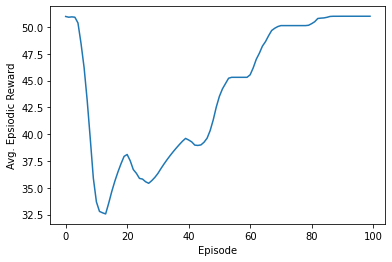

In [ ]:
#@title Training Code
"""
## Training hyperparameters
"""

std_dev = 0.3
ou_noise = OUActionNoise(mean=np.zeros(1), std_deviation=float(std_dev) * np.ones(1))

actor_model = get_actor()
critic_model = get_critic()

target_actor = get_actor()
target_critic = get_critic()

# Making the weights equal initially
target_actor.set_weights(actor_model.get_weights())
target_critic.set_weights(critic_model.get_weights())

# Learning rate for actor-critic models
critic_lr = 0.0003
actor_lr = 0.0001

critic_optimizer = tf.keras.optimizers.Adam(critic_lr)
actor_optimizer = tf.keras.optimizers.Adam(actor_lr)

total_episodes = 100
# Discount factor for future rewards
gamma = 0.99
# Used to update target networks
tau = 0.001

buffer = Buffer(1000000, 256)

"""
Now we implement our main training loop, and iterate over episodes.
We sample actions using `policy()` and train with `learn()` at each time step,
along with updating the Target networks at a rate `tau`.
"""

# To store reward history of each episode
ep_reward_list = []
# To store average reward history of last few episodes
avg_reward_list = []

states_list=[]

# Takes about 4 min to train
for ep in range(total_episodes):

    prev_state = env.reset()
    episodic_reward = 0

    states_list.append(prev_state)

    count=0;

    while True:
        # Uncomment this to see the Actor in action
        # But not in a python notebook.
        # env.render()

        tf_prev_state = tf.expand_dims(tf.convert_to_tensor(prev_state), 0)

        action = policy(tf_prev_state, ou_noise)
        print("insede spisode")
        print(action)
        # Recieve state and reward from environment.
        state, reward, done, info = env.step(action)

        buffer.record((prev_state, action, reward, state))
        episodic_reward += reward

        

        buffer.learn()
        update_target(target_actor.variables, actor_model.variables, tau)
        update_target(target_critic.variables, critic_model.variables, tau)

        states_list.append(state)

        # End this episode when `done` is True
        if done:
            break

        prev_state = state

    ep_reward_list.append(episodic_reward)

    # Mean of last 40 episodes
    avg_reward = np.mean(ep_reward_list[-40:])
    print("Episode * {} * Avg Reward is ==> {}".format(ep, avg_reward))
    avg_reward_list.append(avg_reward)

# Plotting graph
# Episodes versus Avg. Rewards
plt.plot(avg_reward_list)
plt.xlabel("Episode")
plt.ylabel("Avg. Epsiodic Reward")
plt.show()

In [ ]:
import pickle

a_file = open("states_record.pkl", "wb")
pickle.dump(states_record, a_file)
a_file.close()

a_file = open("states_record.pkl", "rb")
output = pickle.load(a_file)
print(output)

[{'rate': 0.6103606700183682, 'total_rate': 705056162, 'sent': 362, 'lost': 0, 'util': 0.6412507939059279, 'old_util': 91918120, 'thpt': 7605902, 'loss_rate': 0}, {'rate': 0.9929537612466476, 'total_rate': 1147007339, 'sent': 1, 'lost': 0, 'util': 0.9936561195775807, 'old_util': 142432576, 'thpt': 313, 'loss_rate': 0}, {'rate': 0.9810879947058225, 'total_rate': 1133300637, 'sent': 292, 'lost': 0, 'util': 0.9829629741250849, 'old_util': 140899800, 'thpt': 6078348, 'loss_rate': 0}, {'rate': 0.9921880403736987, 'total_rate': 1146122819, 'sent': 1, 'lost': 0, 'util': 0.9929665236798837, 'old_util': 142333728, 'thpt': 133, 'loss_rate': 0}, {'rate': 1.0, 'total_rate': 1155146779, 'sent': 1, 'lost': 0, 'util': 1.0, 'old_util': 143341920, 'thpt': 87, 'loss_rate': 0}, {'rate': 1.0, 'total_rate': 1155146779, 'sent': 1, 'lost': 0, 'util': 1.0, 'old_util': 143341920, 'thpt': 87, 'loss_rate': 0}, {'rate': 1.0, 'total_rate': 1155146779, 'sent': 1, 'lost': 0, 'util': 1.0, 'old_util': 143341920, 'thpt

In [ ]:
print(len(states_record))

5200


In [ ]:
pandas_temp=pd.DataFrame(avg_reward_list)

In [ ]:
pandas_temp.to_csv("avg_reward_list.csv")

In [ ]:
df=pd.DataFrame(states_record)
df['rate']=df['rate']*column1_max
df['util']=df['util']*column2_max


# Util vs steps all episodes

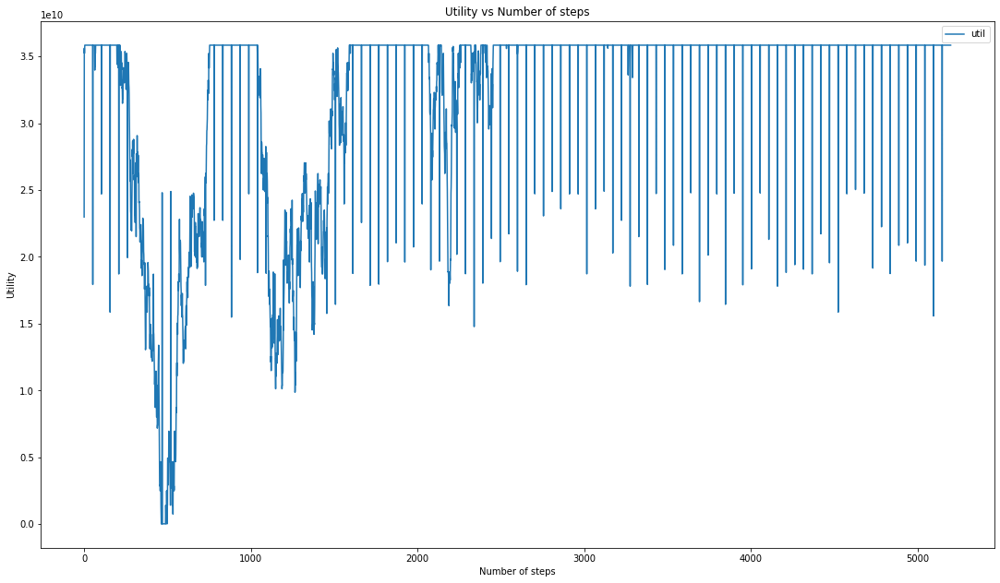

In [ ]:
df1=df.copy()
tempcolumn='util'
df1[tempcolumn] = df1[tempcolumn].astype(int)

df1=df1[[tempcolumn]]

import matplotlib.pyplot as plt
import numpy as np



df1.plot()

from matplotlib.pyplot import figure

fig = plt.gcf()
title="Sending Rates vs Number of steps"
title="Throughput vs Number of steps"
title="Utility vs Number of steps"
plt.title(title)
fig.set_size_inches(18.5, 10.5)
plt.xlabel("Number of steps")
plt.ylabel("Sending Rate")
plt.ylabel("Throughput")
plt.ylabel("Utility")
fig.savefig(tempcolumn+".png", dpi=100,facecolor='white', transparent=False)
plt.show()

# Rate vs steps all episodes

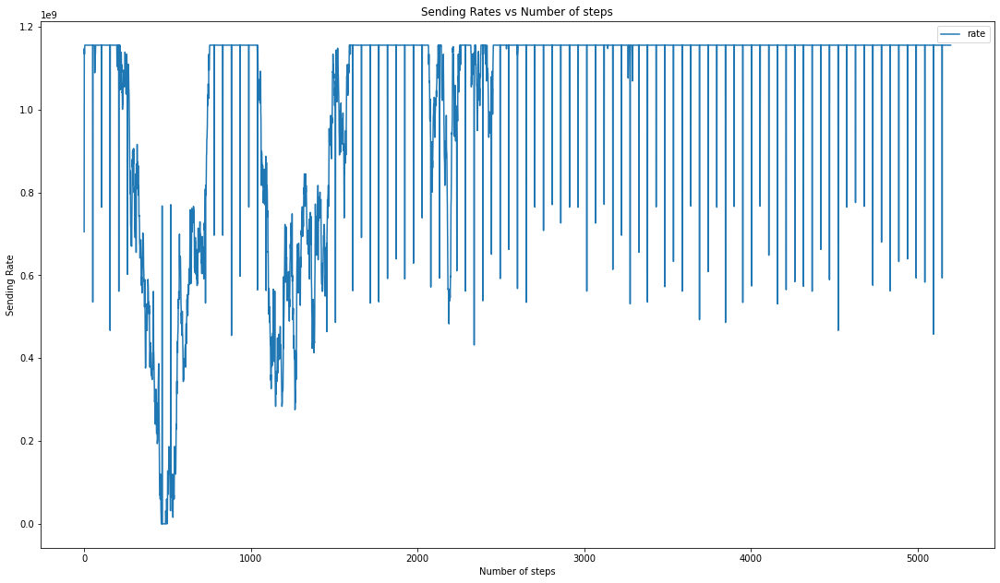

In [ ]:
df1=df.copy()
tempcolumn='rate'
df1[tempcolumn] = df1[tempcolumn].astype(int)

df1=df1[[tempcolumn]]

import matplotlib.pyplot as plt
import numpy as np



df1.plot()

from matplotlib.pyplot import figure

fig = plt.gcf()
title="Sending Rates vs Number of steps"

plt.title(title)
fig.set_size_inches(18.5, 10.5)
plt.xlabel("Number of steps")
plt.ylabel("Sending Rate")

fig.savefig(tempcolumn+".png", dpi=100,facecolor='white', transparent=False)
plt.show()

# Util and Rate vs Steps

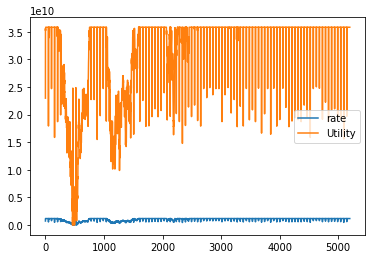

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.pyplot import figure
df1=df.copy()
plt.plot(df1.index,df1['rate'],label="rate")
plt.plot(df1.index,df1['util'],label="Utility")
plt.legend()
plt.show()


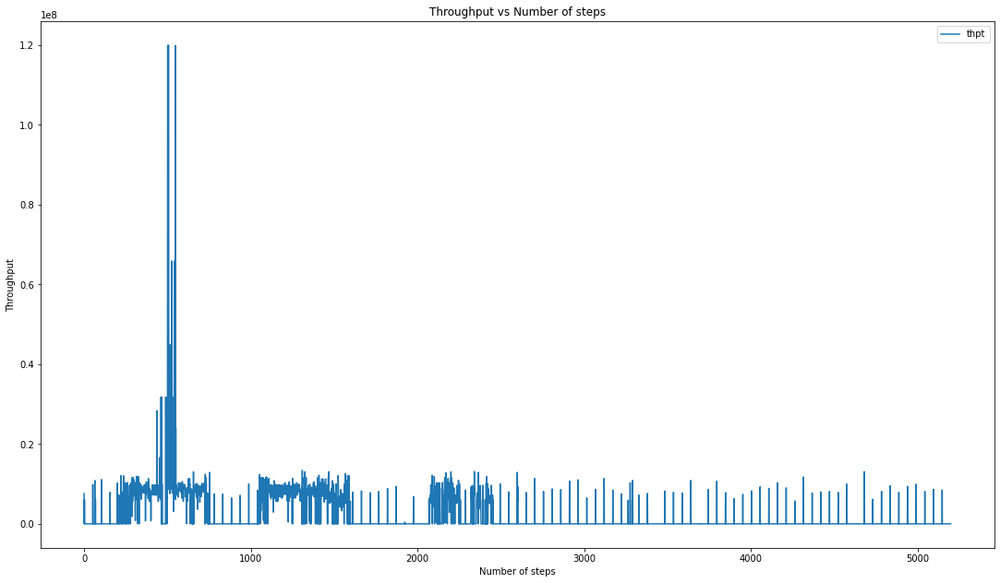

In [ ]:
df1=df.copy()
tempcolumn='thpt'
df1[tempcolumn] = df1[tempcolumn].astype(int)

df1=df1[[tempcolumn]]

import matplotlib.pyplot as plt
import numpy as np



df1.plot()

from matplotlib.pyplot import figure

fig = plt.gcf()
title="Throughput vs Number of steps"
plt.title(title)
fig.set_size_inches(18.5, 10.5)
plt.xlabel("Number of steps")
plt.ylabel("Throughput")
fig.savefig(tempcolumn+".png", dpi=100,facecolor='white', transparent=False)
plt.show()

# Saving individual Episodes csv files

In [ ]:
states_dict
new_states_dict={}

ct=0

for l in states_dict:
  new_states_dict[str(ct)]=states_dict[l]
  ct=ct+1

for group in new_states_dict:
  df2=pd.DataFrame(new_states_dict[group])
  df2.to_csv("Episode"+group+".csv")

In [ ]:
df2=pd.DataFrame(new_states_dict['0'])

In [ ]:
import pickle

a_file = open("new_states_dict.pkl", "wb")
pickle.dump(new_states_dict, a_file)
a_file.close()

a_file = open("new_states_dict.pkl", "rb")
output = pickle.load(a_file)
print(output)

{'0': [{'rate': 0.6103606700183682, 'total_rate': 705056162, 'sent': 362, 'lost': 0, 'util': 0.6412507939059279, 'old_util': 91918120, 'thpt': 7605902, 'loss_rate': 0}, {'rate': 0.9929537612466476, 'total_rate': 1147007339, 'sent': 1, 'lost': 0, 'util': 0.9936561195775807, 'old_util': 142432576, 'thpt': 313, 'loss_rate': 0}, {'rate': 0.9810879947058225, 'total_rate': 1133300637, 'sent': 292, 'lost': 0, 'util': 0.9829629741250849, 'old_util': 140899800, 'thpt': 6078348, 'loss_rate': 0}, {'rate': 0.9921880403736987, 'total_rate': 1146122819, 'sent': 1, 'lost': 0, 'util': 0.9929665236798837, 'old_util': 142333728, 'thpt': 133, 'loss_rate': 0}, {'rate': 1.0, 'total_rate': 1155146779, 'sent': 1, 'lost': 0, 'util': 1.0, 'old_util': 143341920, 'thpt': 87, 'loss_rate': 0}, {'rate': 1.0, 'total_rate': 1155146779, 'sent': 1, 'lost': 0, 'util': 1.0, 'old_util': 143341920, 'thpt': 87, 'loss_rate': 0}, {'rate': 1.0, 'total_rate': 1155146779, 'sent': 1, 'lost': 0, 'util': 1.0, 'old_util': 143341920,

# Graphing Rate vs Number of Steps individually for each episode

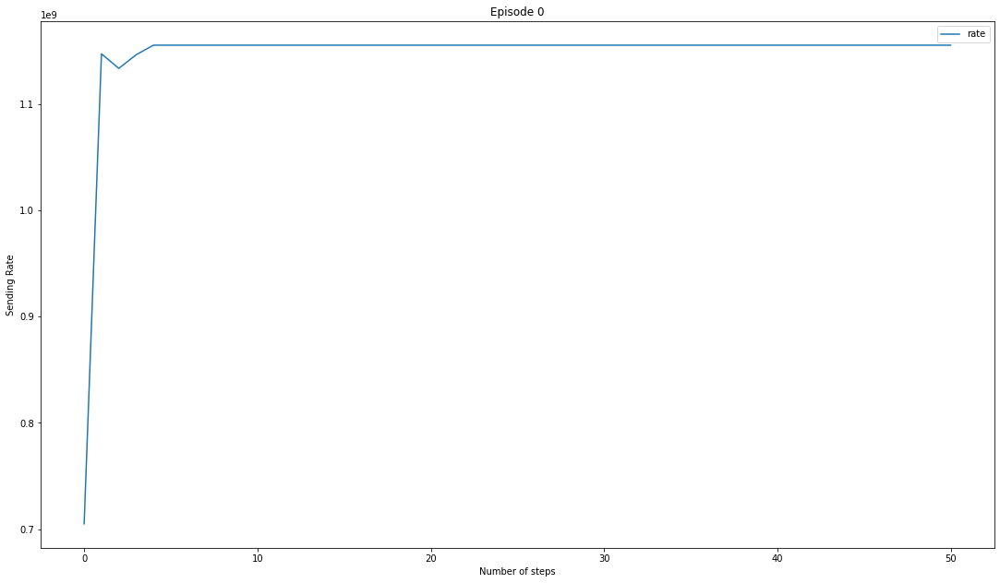

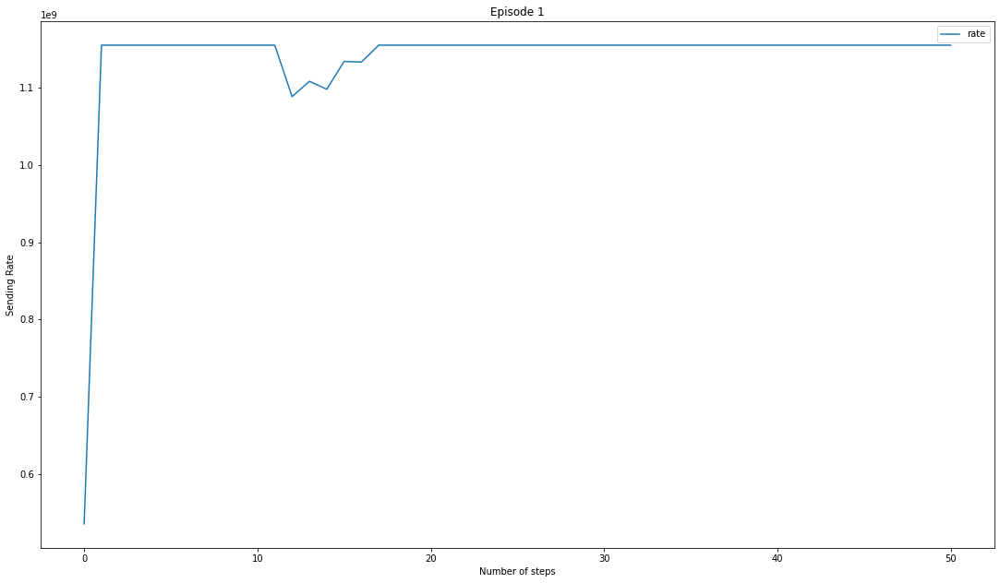

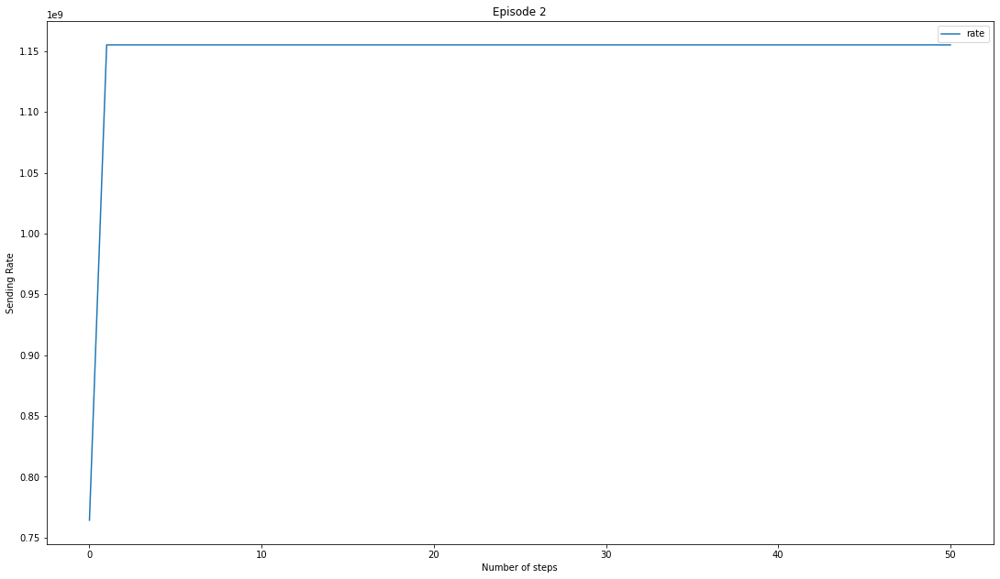

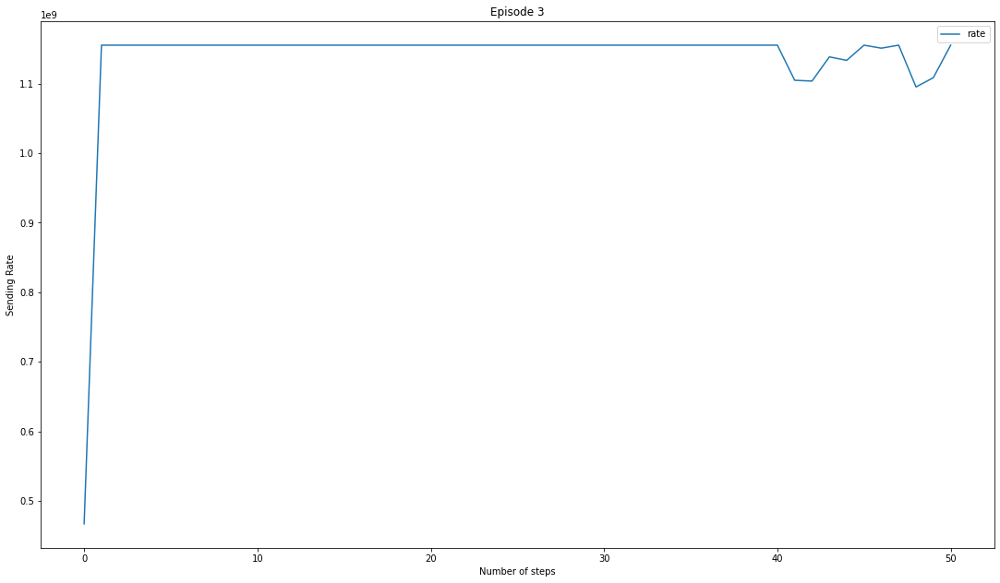

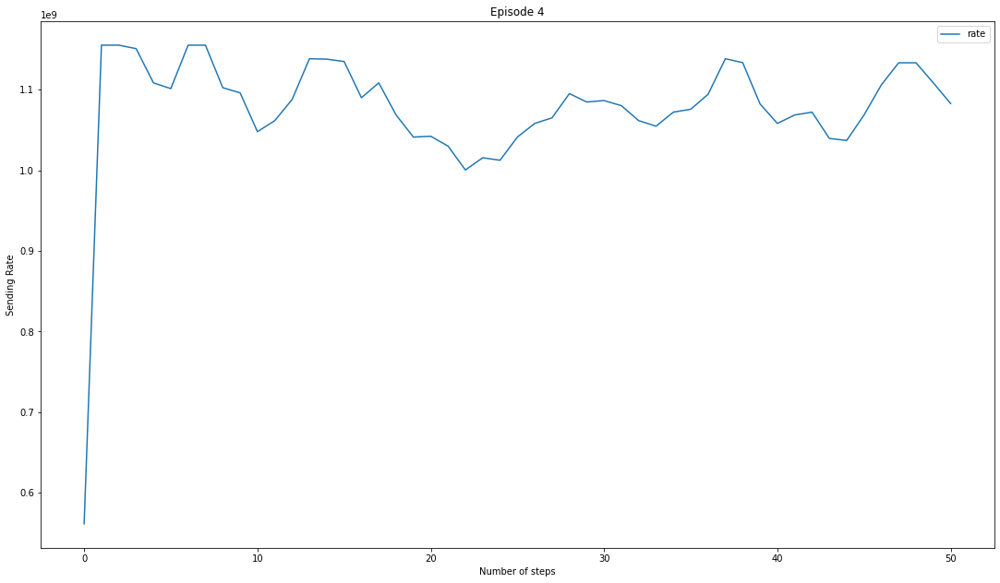

...

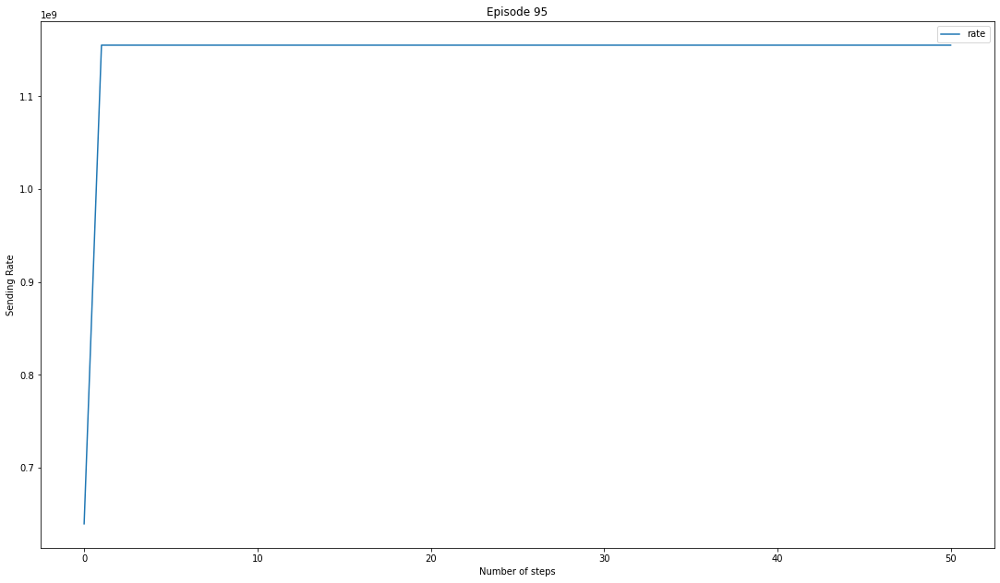

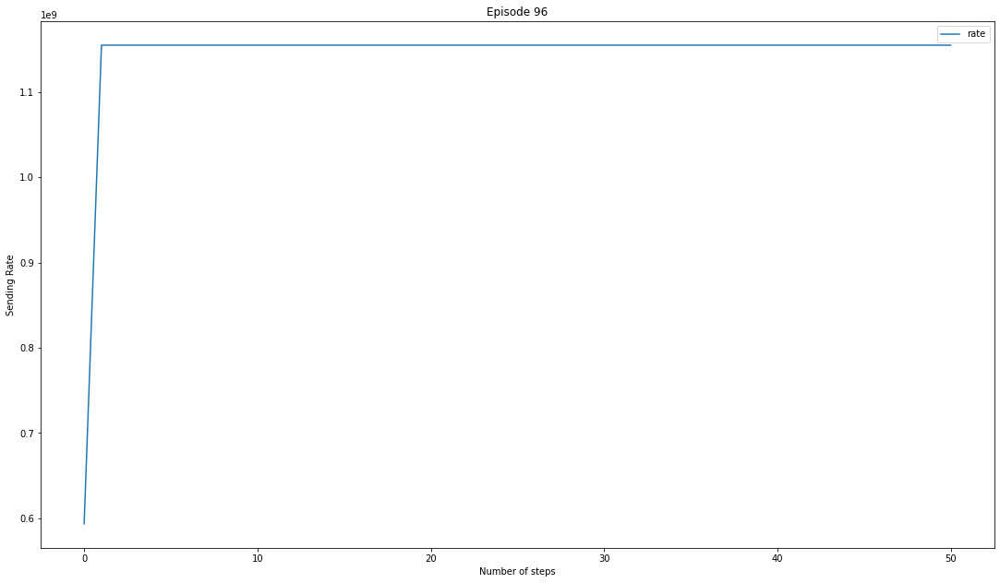

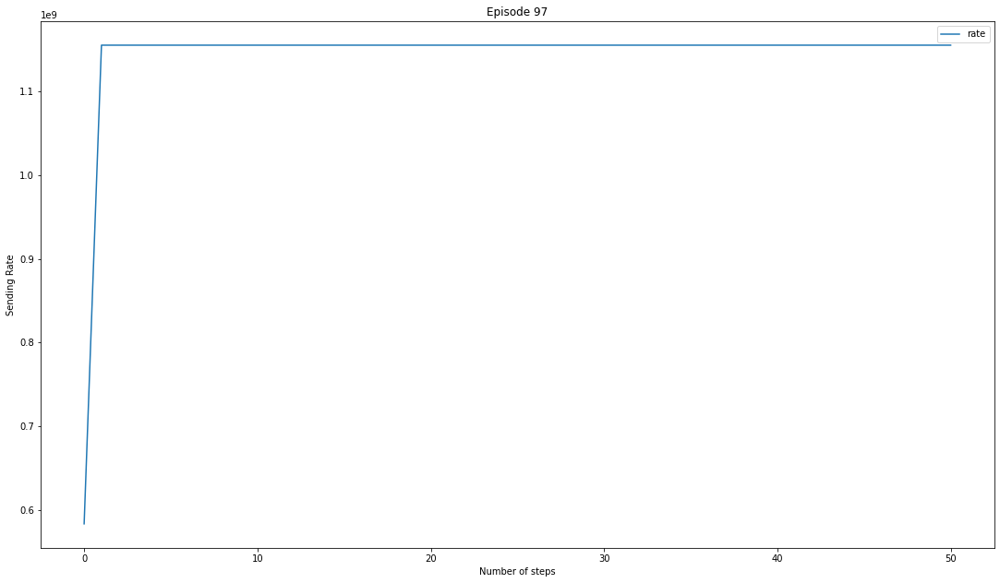

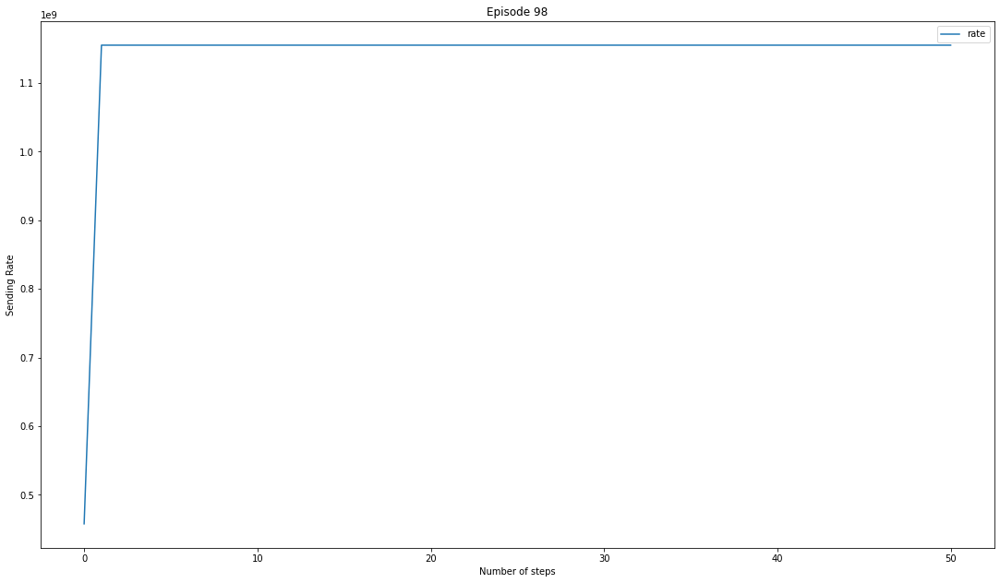

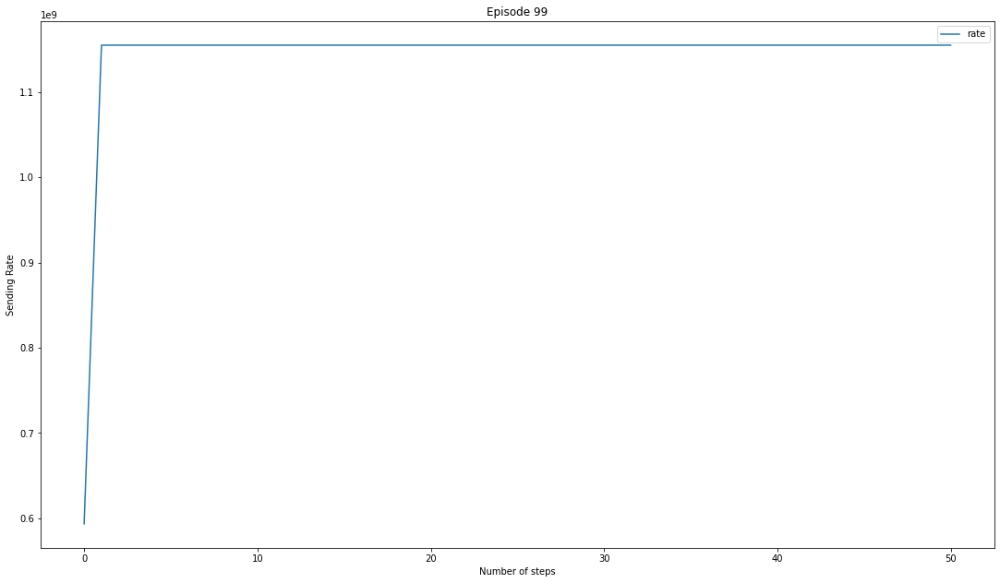

In [ ]:
for group in new_states_dict:
  df2=pd.DataFrame(new_states_dict[group])
  df2['rate']=df2['rate']*column1_max
  df2['util']=df2['util']*column2_max


  df1=df2.copy()
  tempcolumn='rate'
  df1[tempcolumn] = df1[tempcolumn].astype(int)

  df1=df1[[tempcolumn]]

  import matplotlib.pyplot as plt
  import numpy as np



  df1.plot()

  from matplotlib.pyplot import figure

  fig = plt.gcf()
  title="Episode "+group

  plt.title(title)
  fig.set_size_inches(18.5, 10.5)
  plt.xlabel("Number of steps")
  plt.ylabel("Sending Rate")

  fig.savefig(tempcolumn+"-episode"+"-"+group+".png", dpi=100,facecolor='white', transparent=False)
  plt.show()




# Graphing Util vs Number of Steps individually for each episode

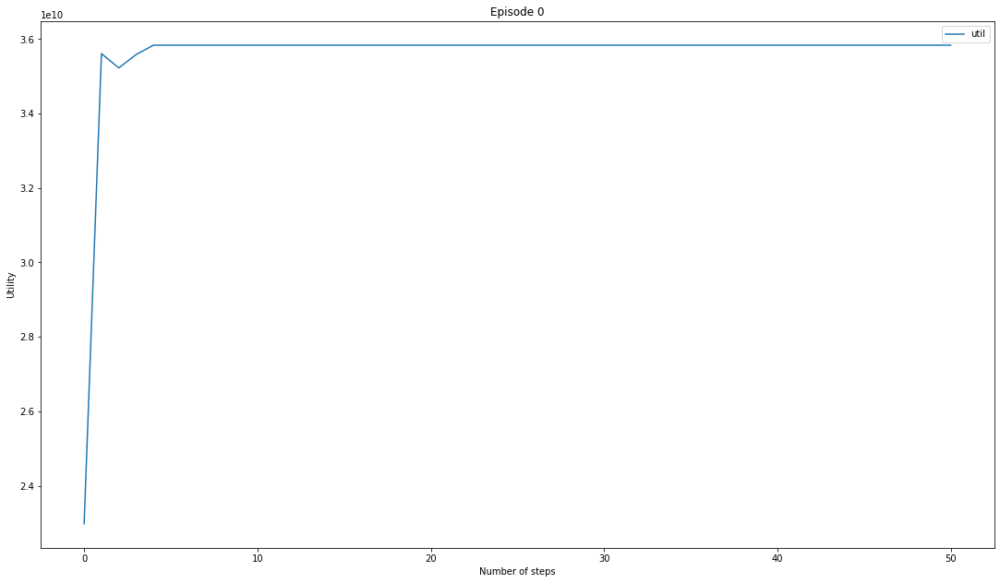

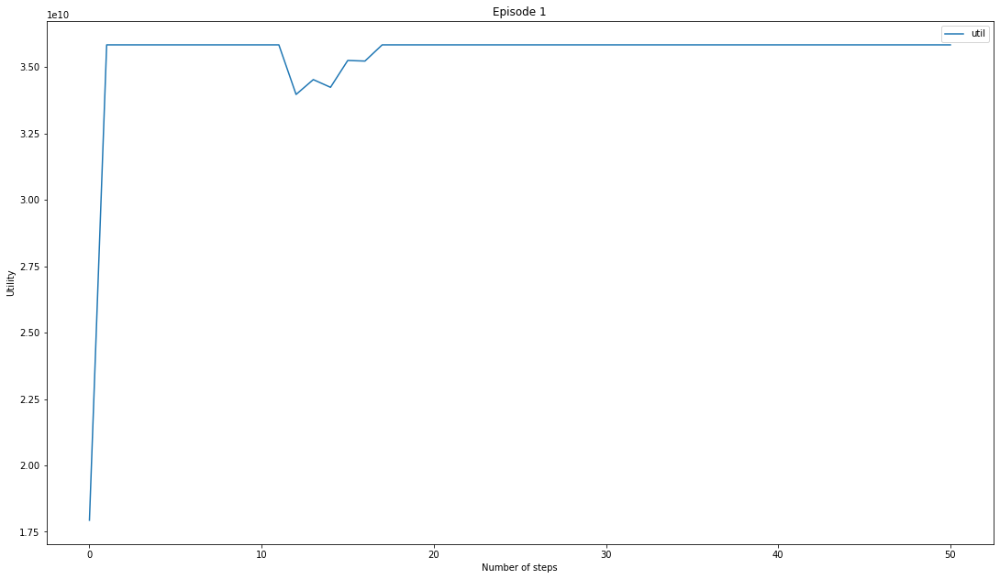

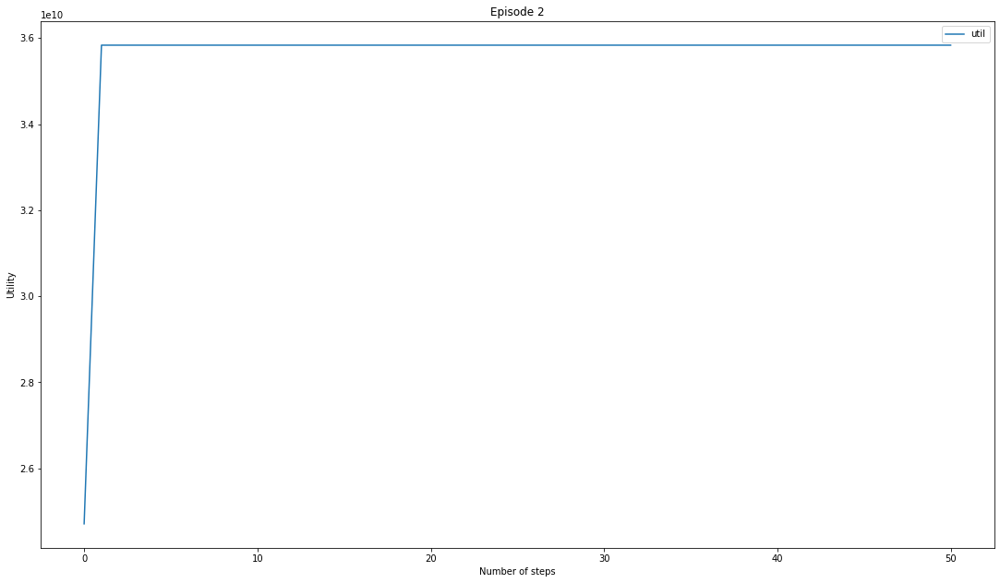

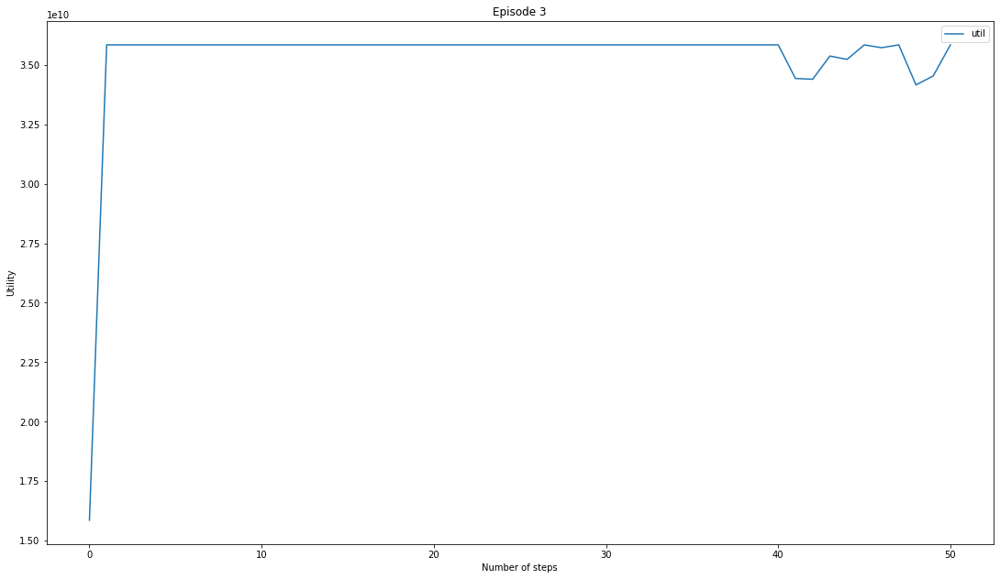

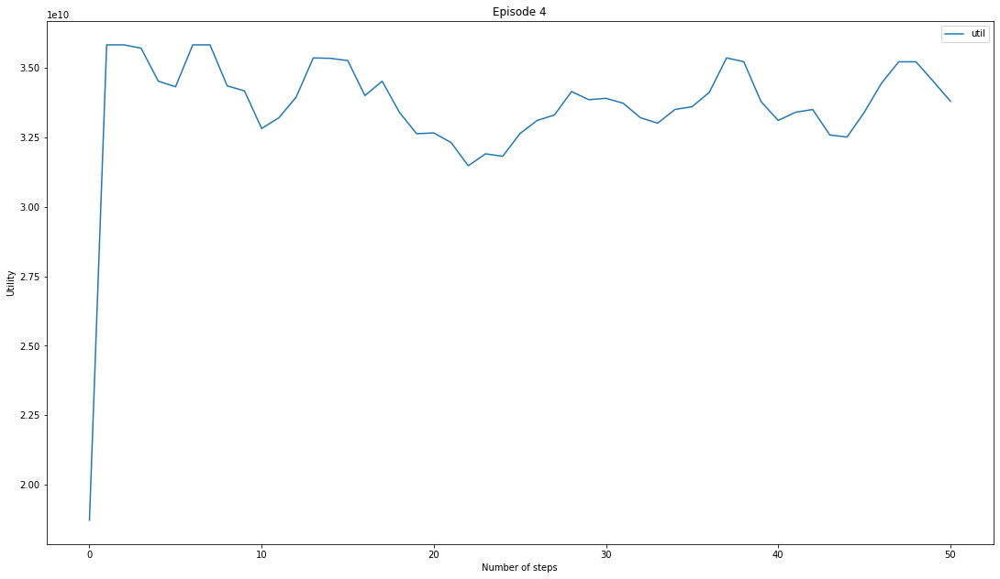

...

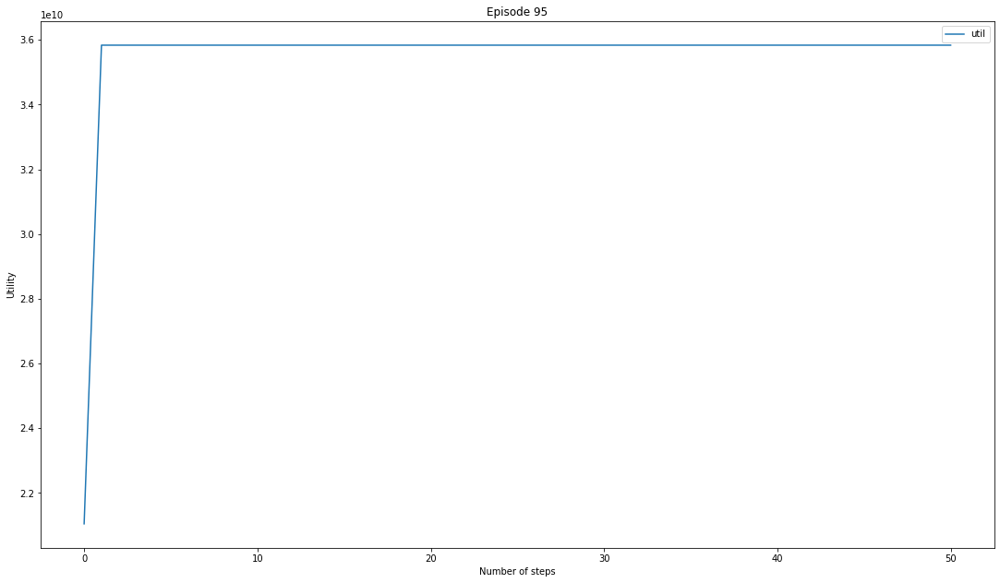

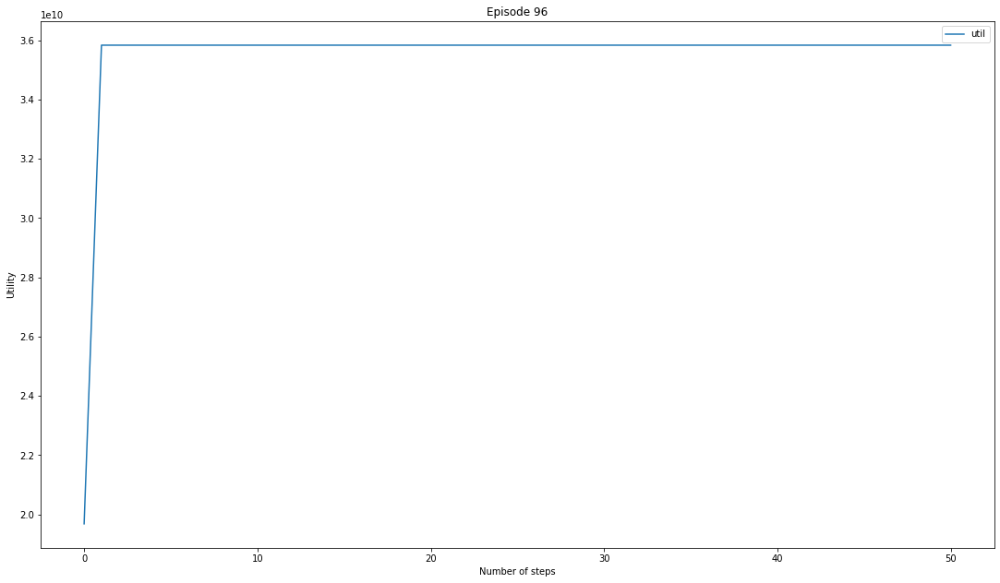

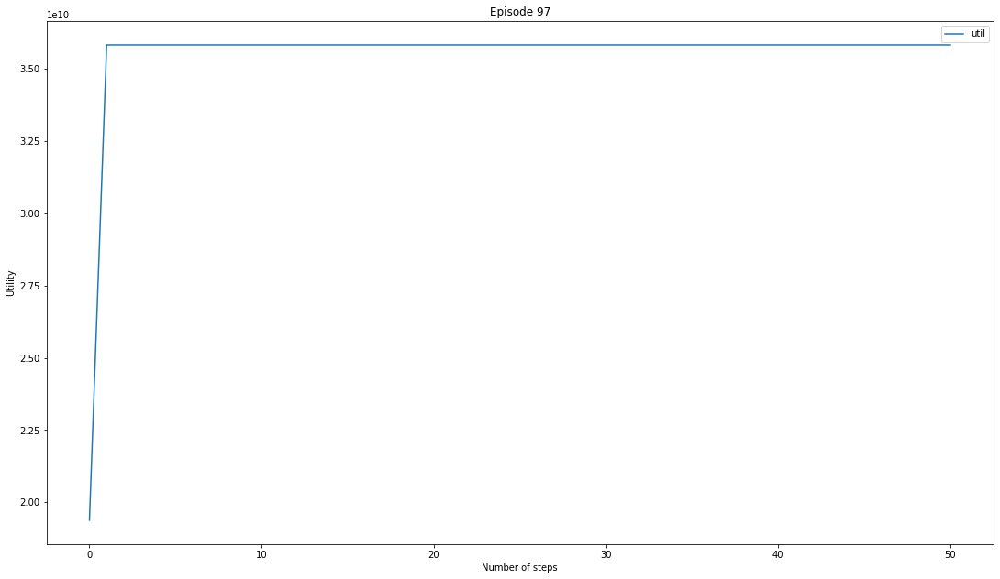

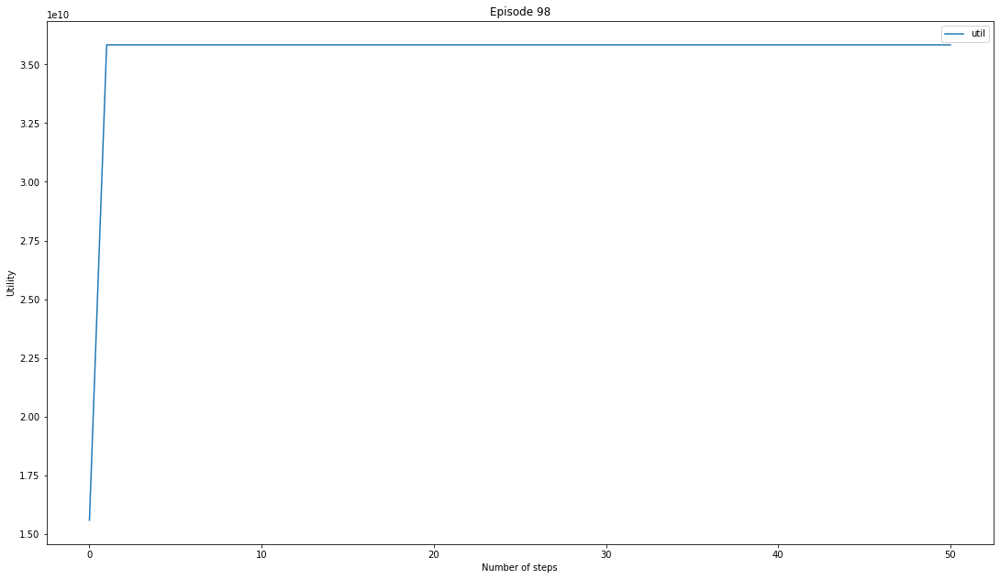

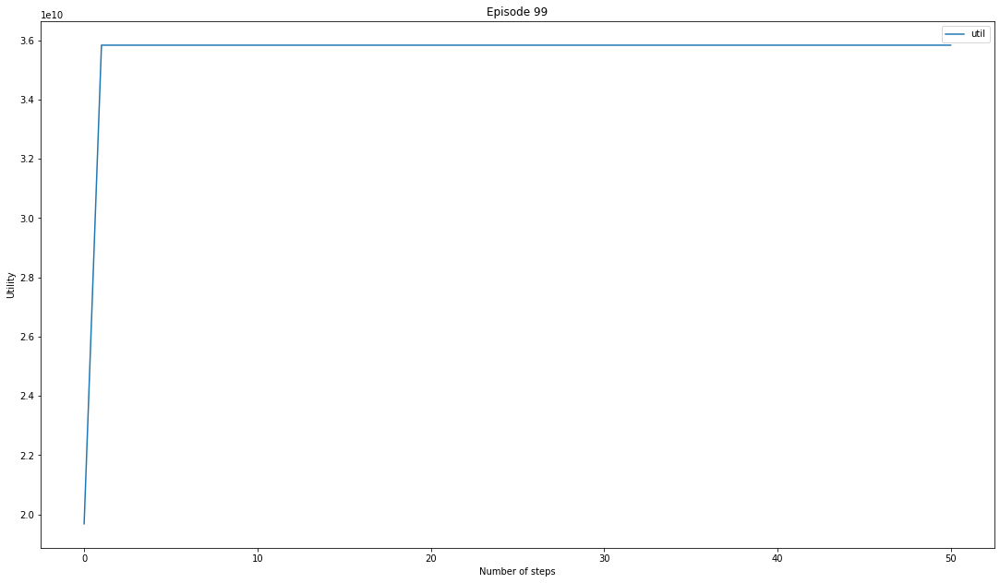

In [ ]:
for group in new_states_dict:
  df2=pd.DataFrame(new_states_dict[group])
  df2['rate']=df2['rate']*column1_max
  df2['util']=df2['util']*column2_max


  df1=df2.copy()
  tempcolumn='util'
  df1[tempcolumn] = df1[tempcolumn].astype(int)

  df1=df1[[tempcolumn]]

  import matplotlib.pyplot as plt
  import numpy as np



  df1.plot()

  from matplotlib.pyplot import figure

  fig = plt.gcf()
  title="Episode "+group

  plt.title(title)
  fig.set_size_inches(18.5, 10.5)
  plt.xlabel("Number of steps")
  plt.ylabel("Utility")

  fig.savefig(tempcolumn+"-episode"+"-"+group+".png", dpi=100,facecolor='white', transparent=False)
  plt.show()




# Rate vs Steps all Episodes in one graph with different lines


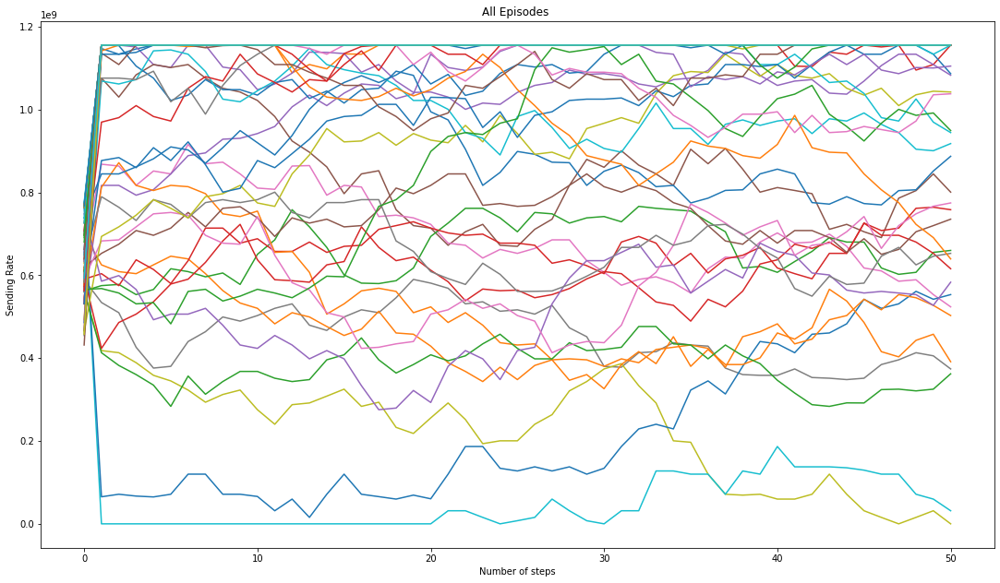

In [ ]:
for group in new_states_dict:
  df2=pd.DataFrame(new_states_dict[group])
  df2['rate']=df2['rate']*column1_max
  df2['util']=df2['util']*column2_max


  df1=df2.copy()
  tempcolumn='rate'
  df1[tempcolumn] = df1[tempcolumn].astype(int)

  df1=df1[[tempcolumn]]

  import matplotlib.pyplot as plt
  import numpy as np


  plt.plot(df1.index,df1[tempcolumn],label="Sending Rate")

  from matplotlib.pyplot import figure

  fig = plt.gcf()
  title="All Episodes "

  plt.title(title)
  fig.set_size_inches(18.5, 10.5)
  plt.xlabel("Number of steps")
  plt.ylabel("Sending Rate")



plt.show()
fig.savefig(tempcolumn+"-episode"+"-"+group+".png", dpi=100,facecolor='white', transparent=False)




# Util vs Steps all Episodes in one graph with different lines


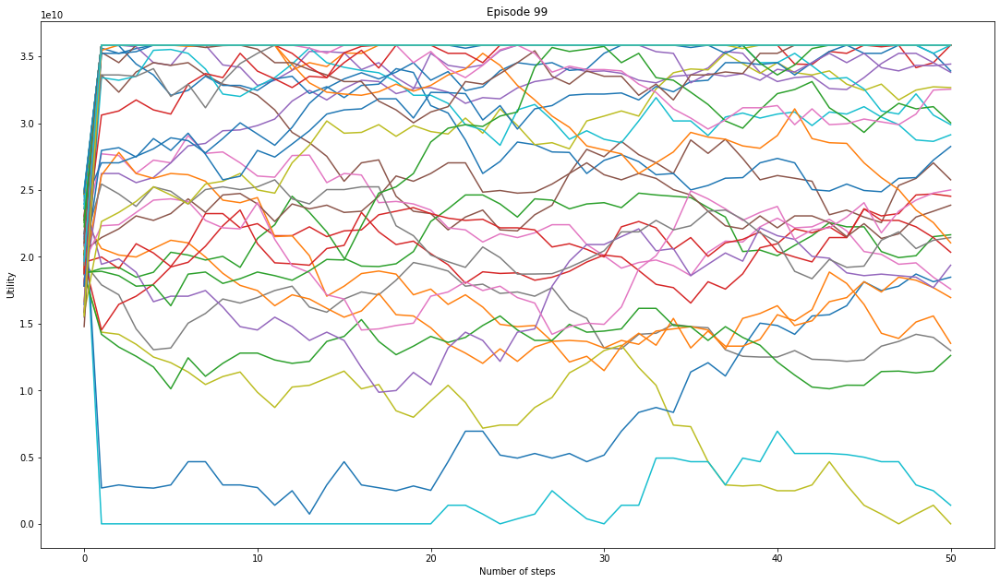

In [ ]:
for group in new_states_dict:
  df2=pd.DataFrame(new_states_dict[group])
  df2['rate']=df2['rate']*column1_max
  df2['util']=df2['util']*column2_max


  df1=df2.copy()
  tempcolumn='util'
  df1[tempcolumn] = df1[tempcolumn].astype(int)

  df1=df1[[tempcolumn]]

  import matplotlib.pyplot as plt
  import numpy as np



  plt.plot(df1.index,df1[tempcolumn],label="Sending Rate")

  from matplotlib.pyplot import figure

  fig = plt.gcf()
  title="Episode "+group

  plt.title(title)
  fig.set_size_inches(18.5, 10.5)
  plt.xlabel("Number of steps")
  plt.ylabel("Utility")


plt.show()
fig.savefig(tempcolumn+"-episode"+"-"+group+".png", dpi=100,facecolor='white', transparent=False)




# Comparing it with mpcc values - Util

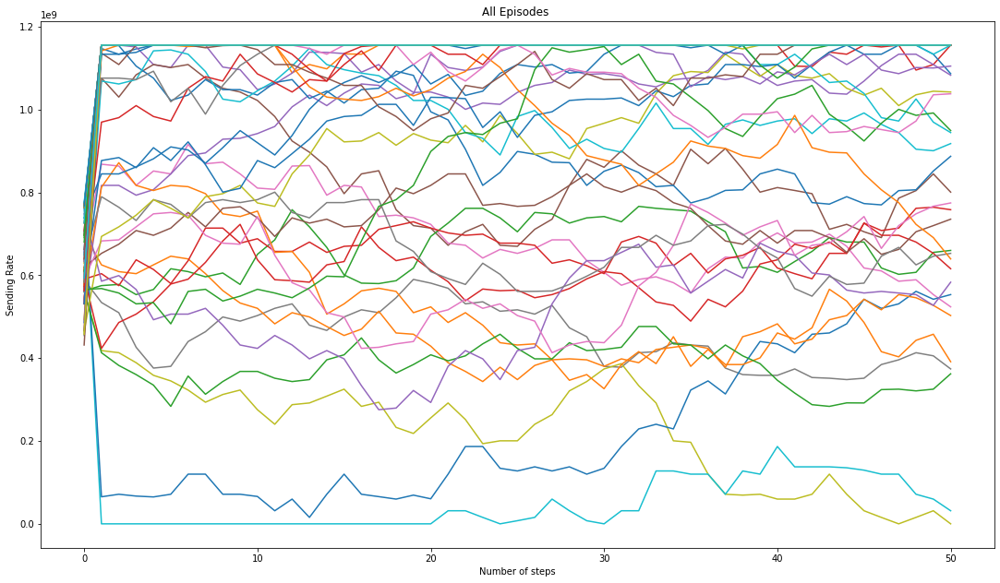

In [ ]:
for group in new_states_dict:
  df2=pd.DataFrame(new_states_dict[group])
  df2['rate']=df2['rate']*column1_max
  df2['util']=df2['util']*column2_max


  df1=df2.copy()
  tempcolumn='rate'
  df1[tempcolumn] = df1[tempcolumn].astype(int)

  df1=df1[[tempcolumn]]

  import matplotlib.pyplot as plt
  import numpy as np


  plt.plot(df1.index,df1[tempcolumn],label="Sending Rate")

  from matplotlib.pyplot import figure

  fig = plt.gcf()
  title="All Episodes "

  plt.title(title)
  fig.set_size_inches(18.5, 10.5)
  plt.xlabel("Number of steps")
  plt.ylabel("Sending Rate")



plt.show()
fig.savefig(tempcolumn+"-episode"+"-"+group+".png", dpi=100,facecolor='white', transparent=False)




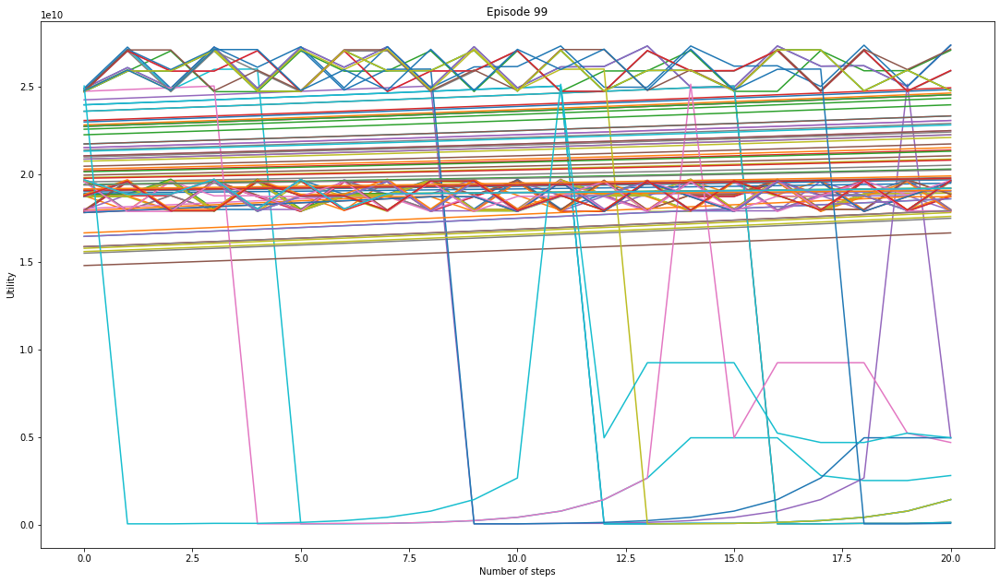

In [ ]:
for group in new_states_dict:
  temp2=pd.DataFrame(new_states_dict[group])
  df=pd.read_csv("rlinputdata.csv", parse_dates=True)

  temp2['rate']=temp2['rate']*column1_max
  temp2['util']=temp2['util']*column2_max

  input=float(temp2.head(1)["rate"])
  cur_index=int(df.iloc[(df['rate']-input).abs().argsort()[:1]].index.to_list()[0])
  temp1=df.iloc[(cur_index):(cur_index+21)]

  reindex_list=[]
  for i in range(21):
    reindex_list.append(i)


  temp1=temp1.reset_index(drop=True)



  tempcolumn='util'

  temp1[tempcolumn] = temp1[tempcolumn].astype(int)
  temp1=temp1[[tempcolumn]]


  temp2[tempcolumn] = temp2[tempcolumn].astype(int)
  temp2=temp2[[tempcolumn]]

  import matplotlib.pyplot as plt
  import numpy as np

  from matplotlib.pyplot import figure

  fig = plt.gcf()
  title="Episode "+group

  plt.title(title)
  fig.set_size_inches(18.5, 10.5)

  # plt.plot(temp1.index,temp1['rate'],label="rate")
  plt.plot(temp1.index,temp1['util'],label="Utility")

  # plt.plot(temp2.index,temp2['rate'],label="rate")
  # plt.plot(temp2.index,temp2['util'],label="Utility")

  plt.xlabel("Number of steps")
  plt.ylabel("Utility")
plt.show()

  # fig.savefig(tempcolumn+"-episode"+"-"+group+"MPCC_compare.png", dpi=100,facecolor='white', transparent=False)

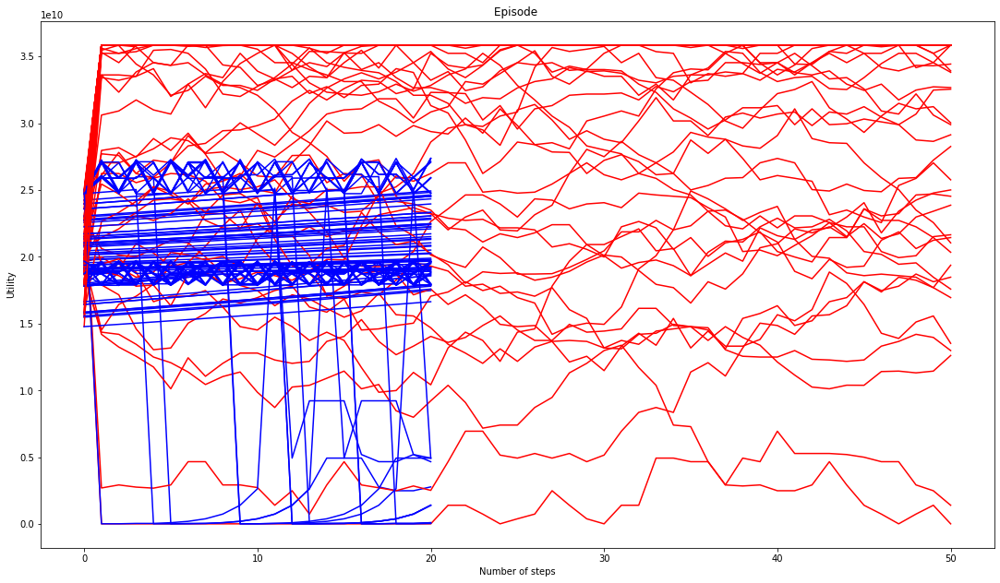

In [ ]:
for group in new_states_dict:
  temp2=pd.DataFrame(new_states_dict[group])
  df=pd.read_csv("rlinputdata.csv", parse_dates=True)

  temp2['rate']=temp2['rate']*column1_max
  temp2['util']=temp2['util']*column2_max

  input=float(temp2.head(1)["rate"])
  cur_index=int(df.iloc[(df['rate']-input).abs().argsort()[:1]].index.to_list()[0])
  temp1=df.iloc[(cur_index):(cur_index+21)]

  reindex_list=[]
  for i in range(21):
    reindex_list.append(i)


  temp1=temp1.reset_index(drop=True)



  tempcolumn='util'

  temp1[tempcolumn] = temp1[tempcolumn].astype(int)
  temp1=temp1[[tempcolumn]]


  temp2[tempcolumn] = temp2[tempcolumn].astype(int)
  temp2=temp2[[tempcolumn]]

  import matplotlib.pyplot as plt
  import numpy as np

  from matplotlib.pyplot import figure

  fig = plt.gcf()
  title="Episode "

  plt.title(title)
  fig.set_size_inches(18.5, 10.5)

  # plt.plot(temp1.index,temp1['rate'],label="rate")
  plt.plot(temp2.index,temp2['util'],label="Utility",color="red")
  plt.plot(temp1.index,temp1['util'],label="Utility",color="blue")

  # plt.plot(temp2.index,temp2['rate'],label="rate")
  # plt.plot(temp2.index,temp2['util'],label="Utility")

  plt.xlabel("Number of steps")
  plt.ylabel("Utility")
plt.show()

  # fig.savefig(tempcolumn+"-episode"+"-"+group+"MPCC_compare.png", dpi=100,facecolor='white', transparent=False)

# Comparing it with mpcc values - Rate

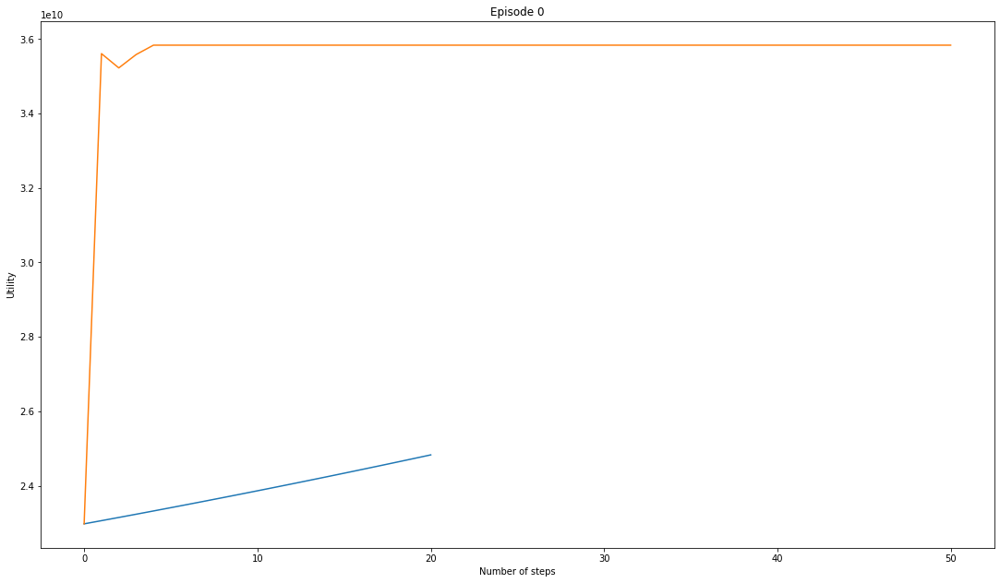

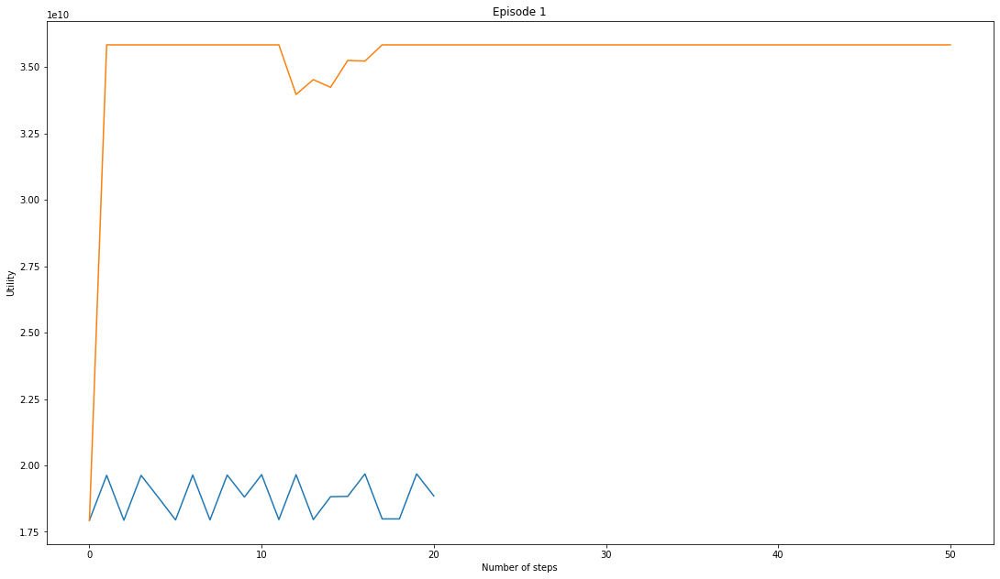

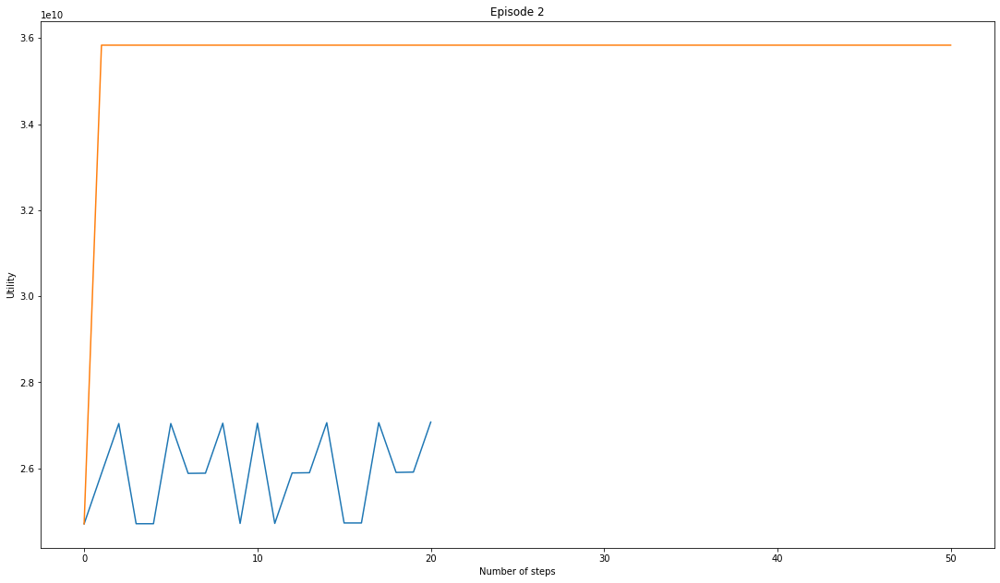

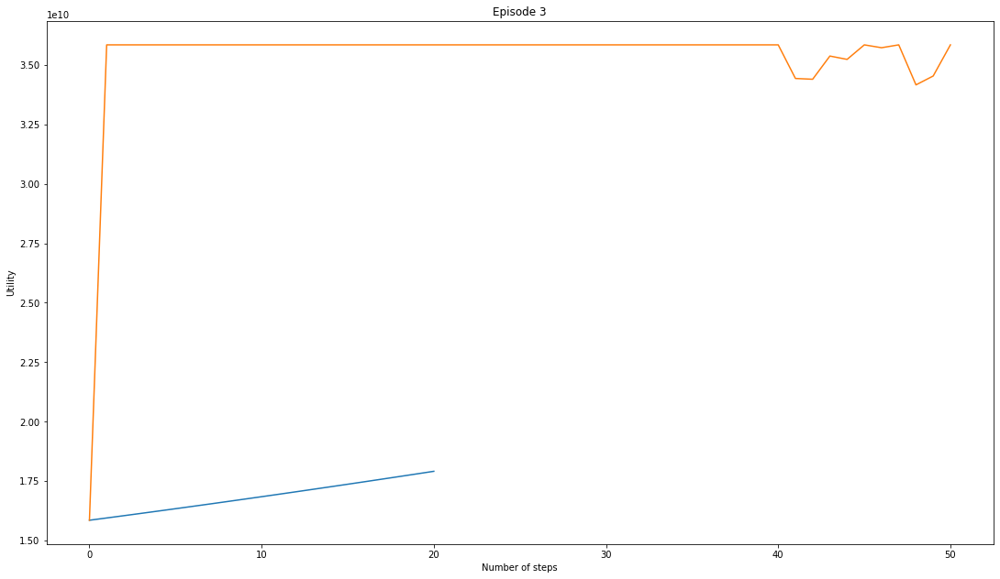

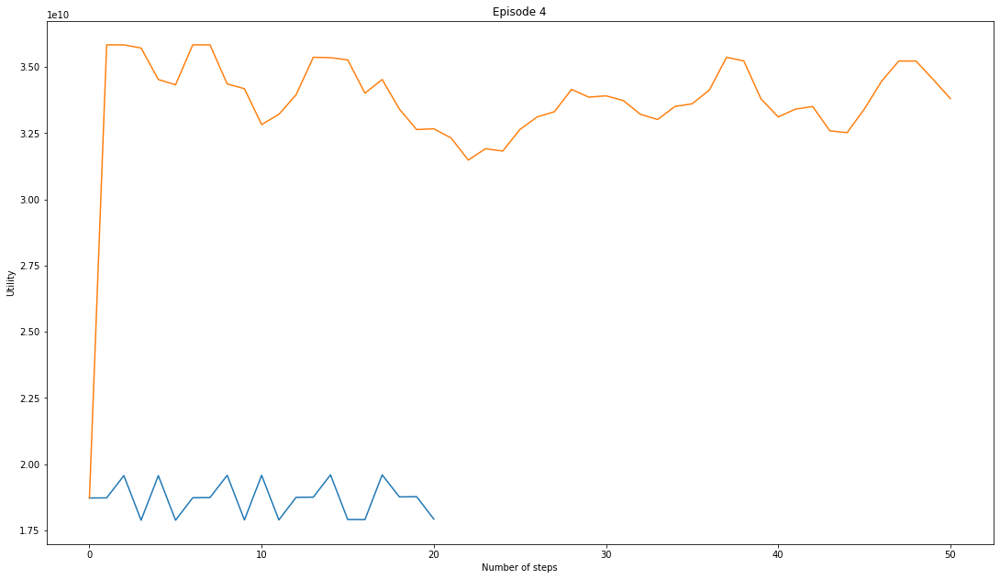

...

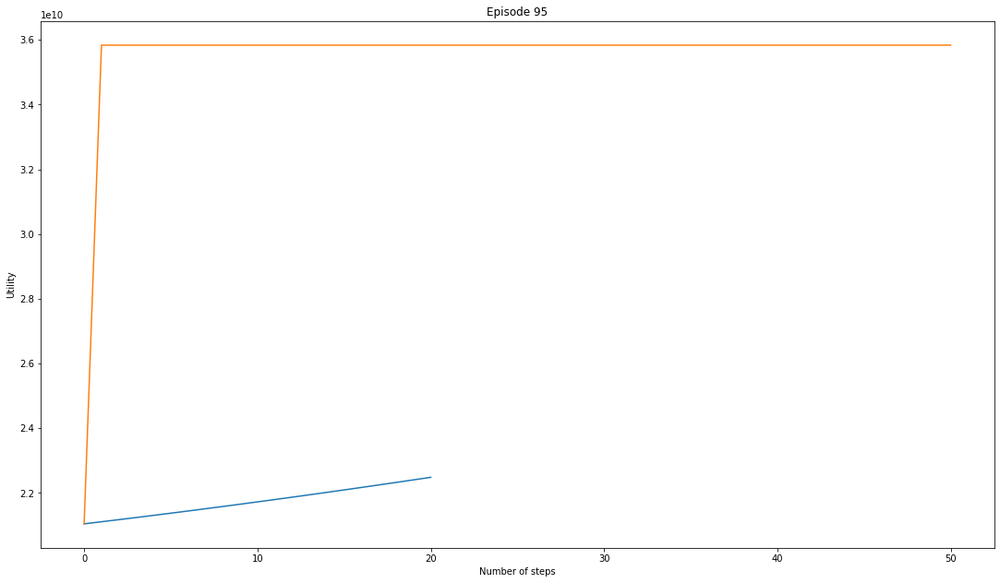

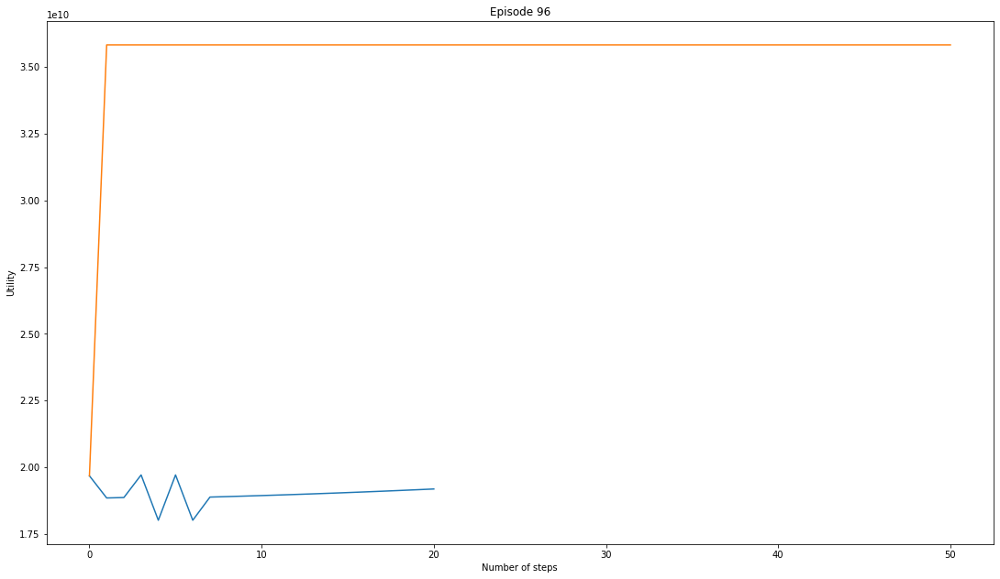

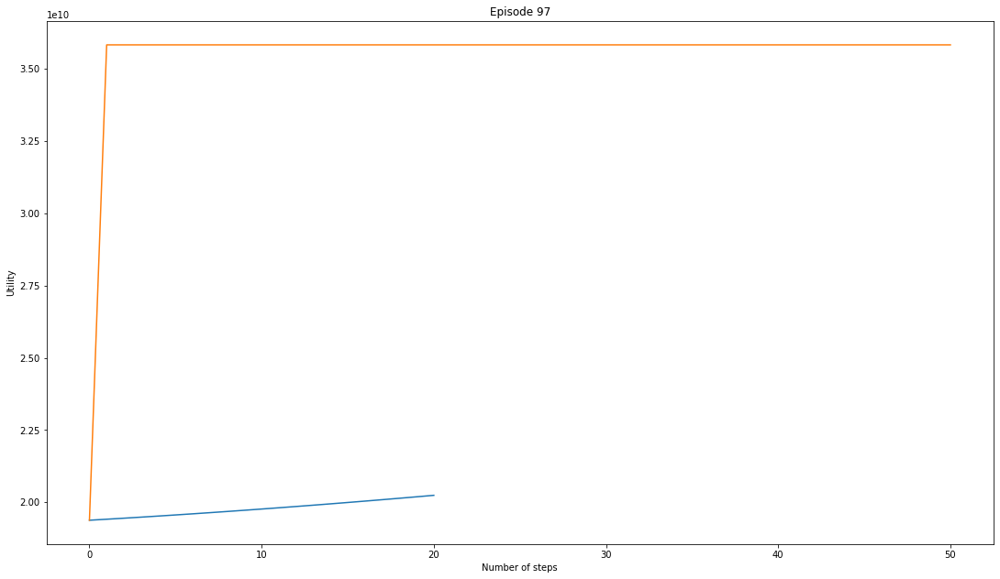

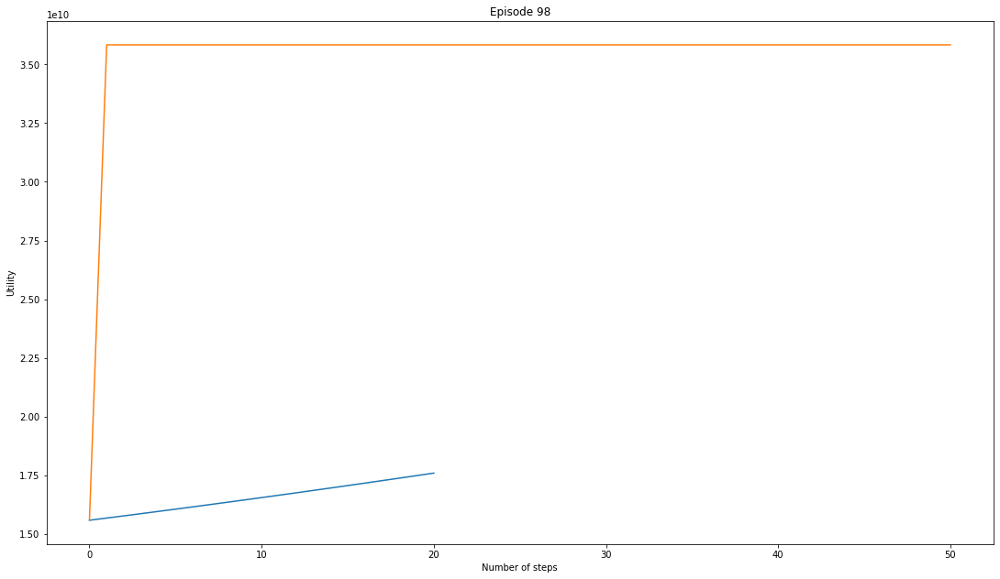

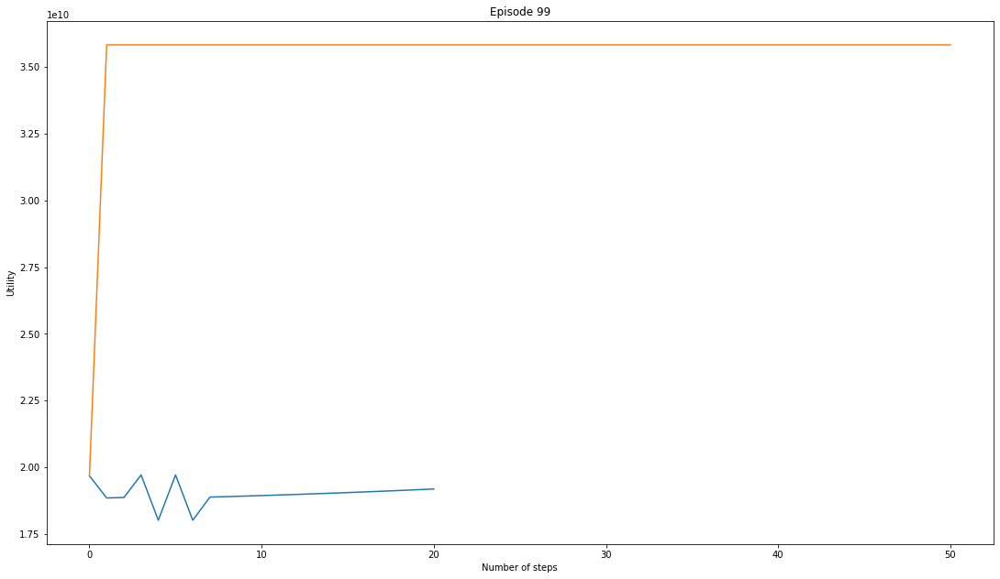

In [ ]:
for group in new_states_dict:
  temp2=pd.DataFrame(new_states_dict[group])
  df=pd.read_csv("rlinputdata.csv", parse_dates=True)

  temp2['rate']=temp2['rate']*column1_max
  temp2['util']=temp2['util']*column2_max

  input=float(temp2.head(1)["rate"])
  cur_index=int(df.iloc[(df['rate']-input).abs().argsort()[:1]].index.to_list()[0])
  temp1=df.iloc[(cur_index):(cur_index+21)]

  reindex_list=[]
  for i in range(21):
    reindex_list.append(i)


  temp1=temp1.reset_index(drop=True)



  tempcolumn='util'

  temp1[tempcolumn] = temp1[tempcolumn].astype(int)
  temp1=temp1[[tempcolumn]]


  temp2[tempcolumn] = temp2[tempcolumn].astype(int)
  temp2=temp2[[tempcolumn]]

  import matplotlib.pyplot as plt
  import numpy as np

  from matplotlib.pyplot import figure

  fig = plt.gcf()
  title="Episode "+group

  plt.title(title)
  fig.set_size_inches(18.5, 10.5)

  # plt.plot(temp1.index,temp1['rate'],label="rate")
  plt.plot(temp1.index,temp1['util'],label="Utility")

  # plt.plot(temp2.index,temp2['rate'],label="rate")
  plt.plot(temp2.index,temp2['util'],label="Utility")

  plt.xlabel("Number of steps")
  plt.ylabel("Utility")
  plt.show()

  fig.savefig(tempcolumn+"-episode"+"-"+group+"MPCC_compare.png", dpi=100,facecolor='white', transparent=False)

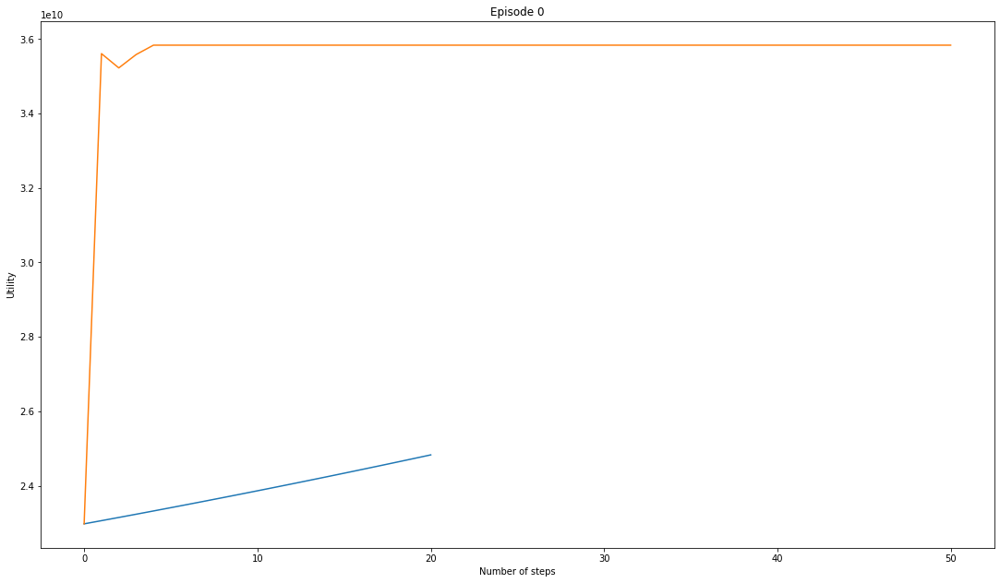

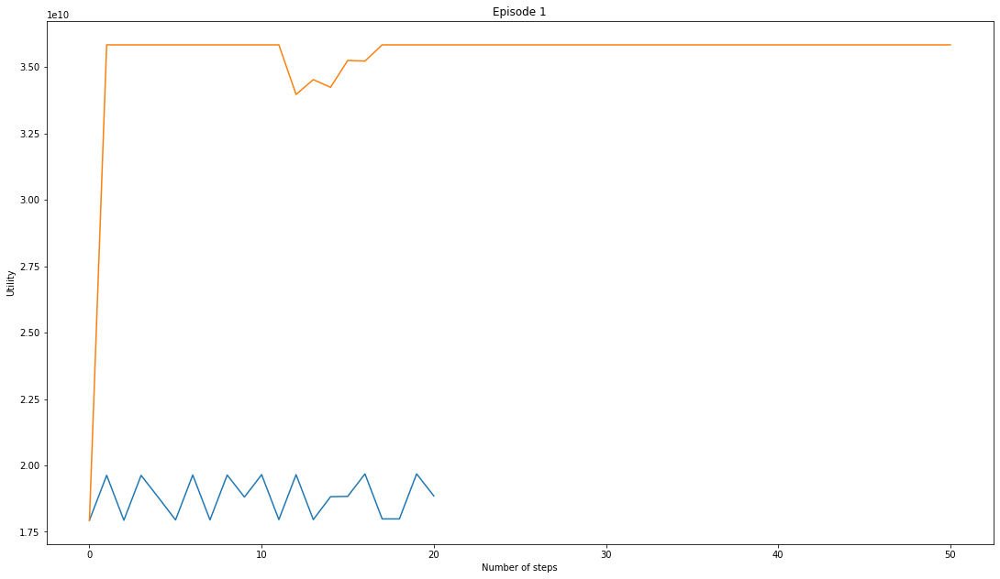

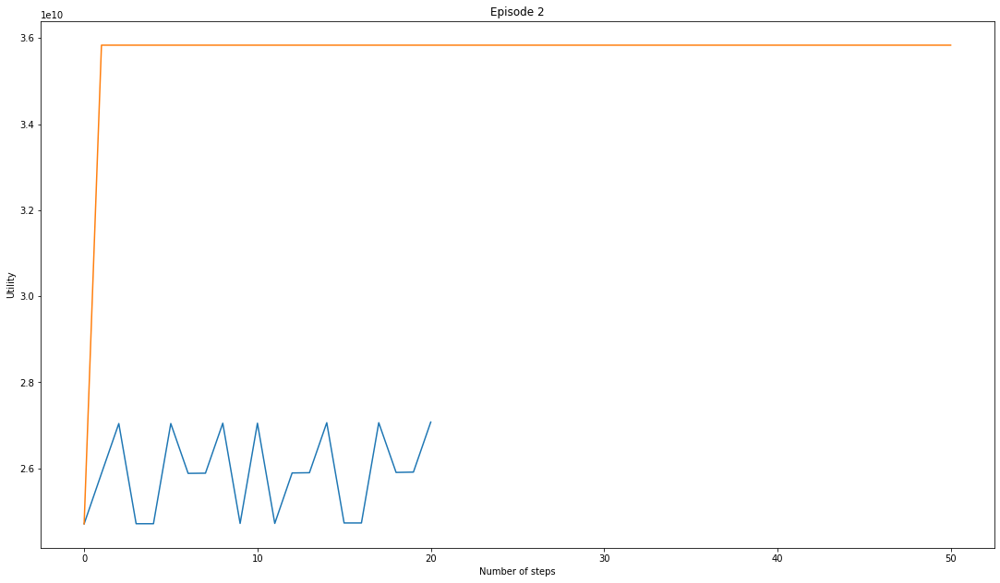

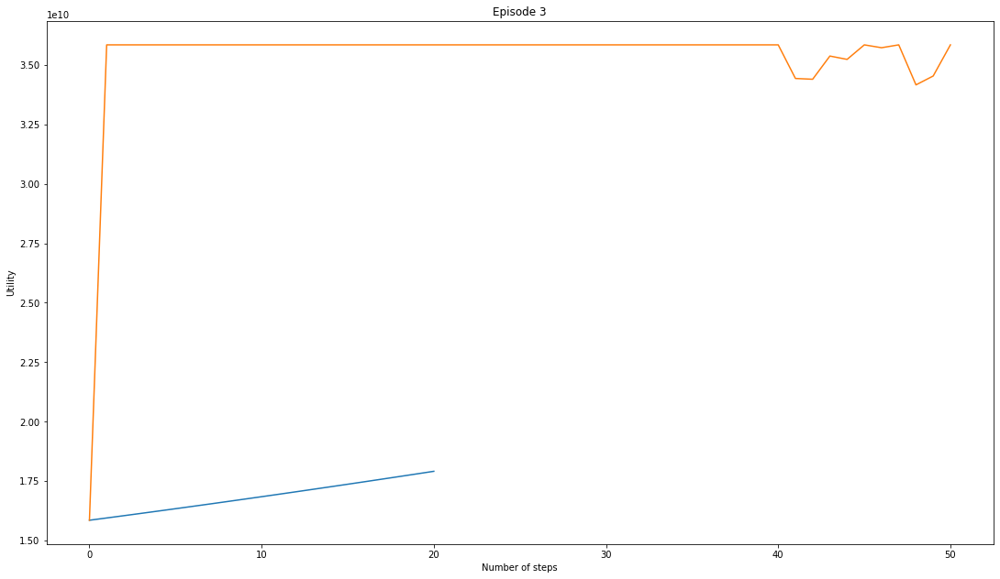

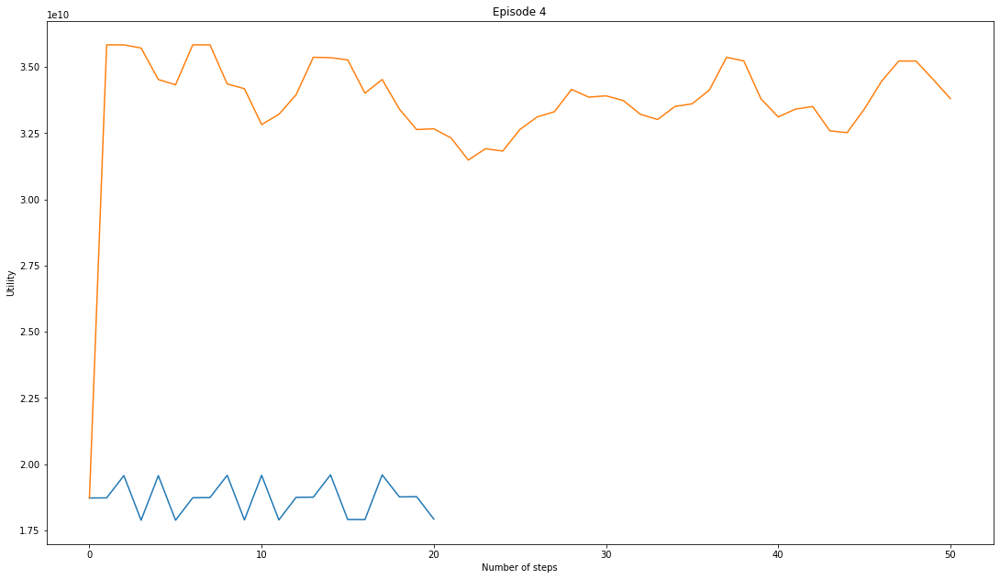

...

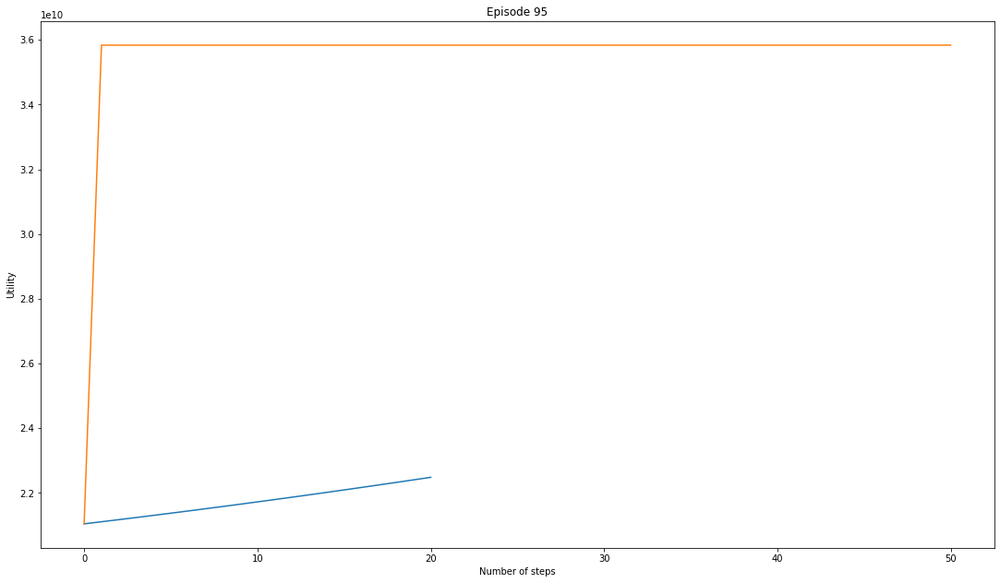

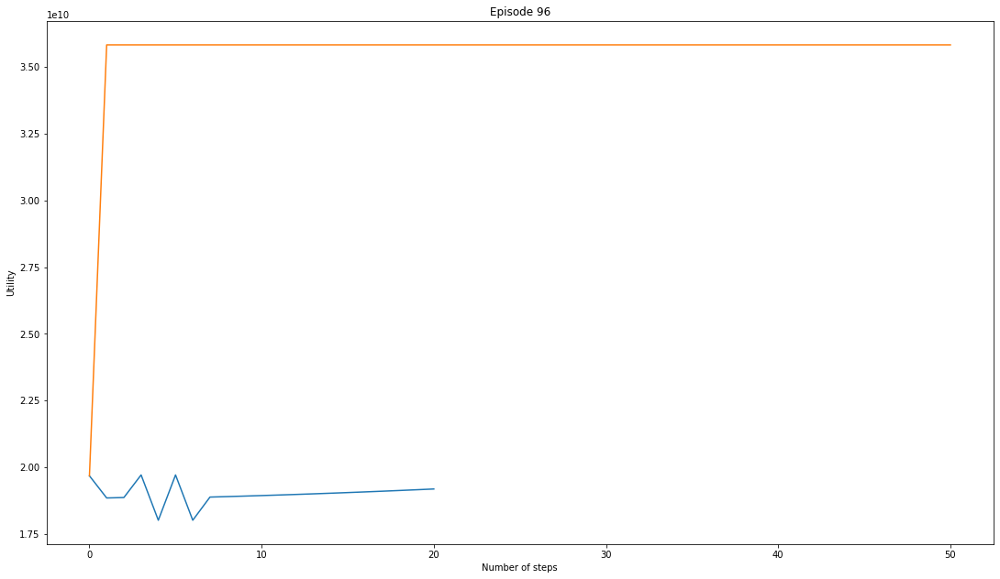

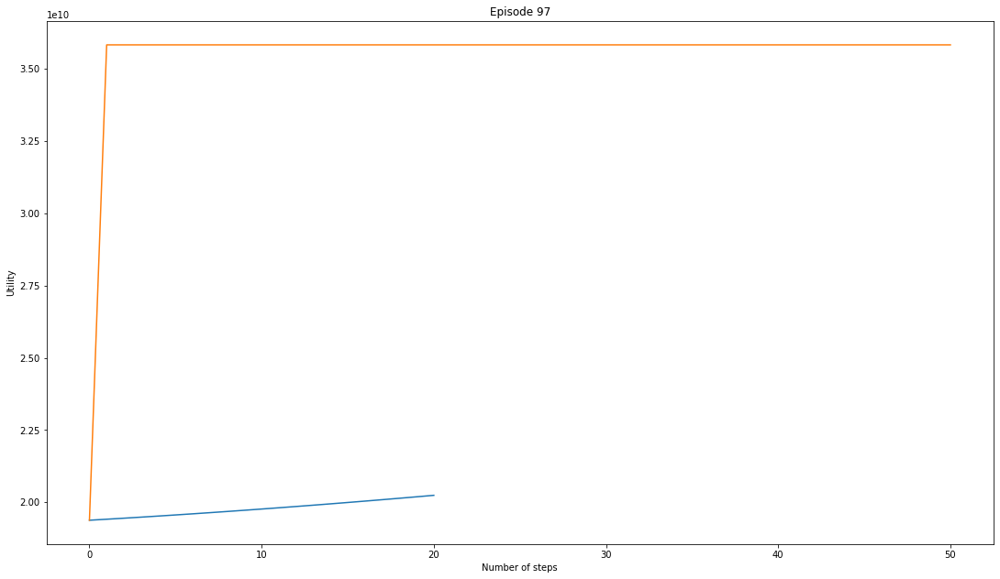

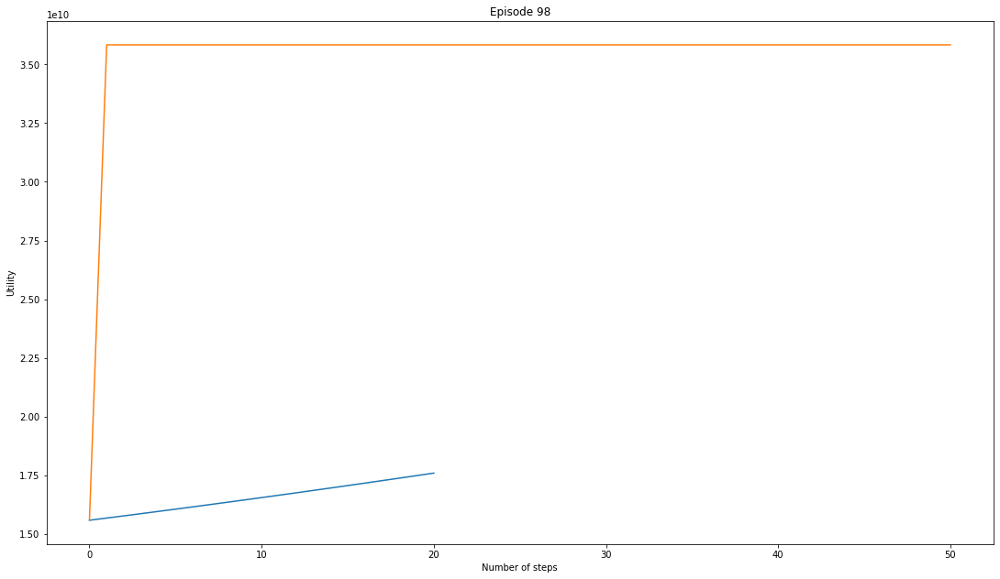

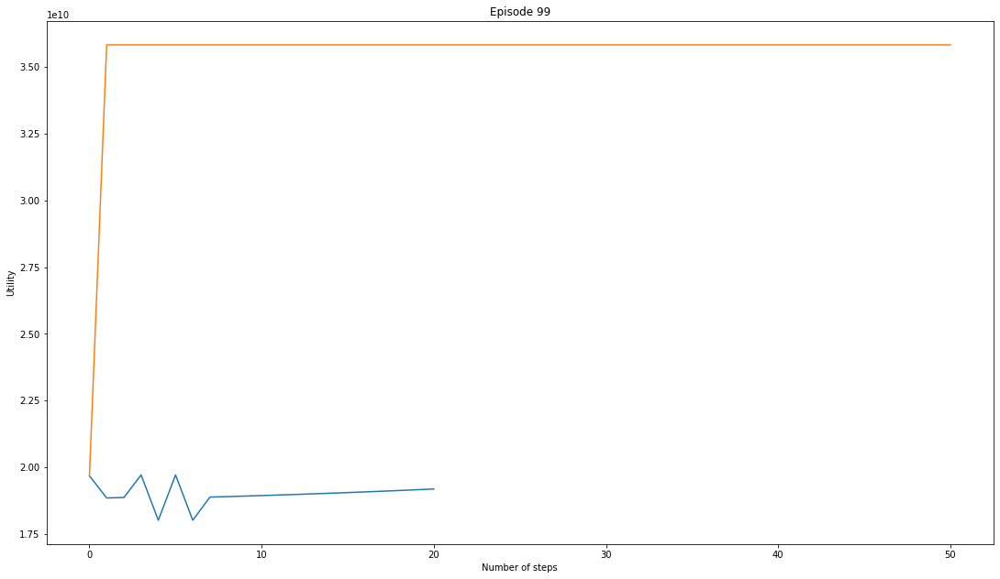

In [ ]:
for group in new_states_dict:
  temp2=pd.DataFrame(new_states_dict[group])
  df=pd.read_csv("rlinputdata.csv", parse_dates=True)

  temp2['rate']=temp2['rate']*column1_max
  temp2['util']=temp2['util']*column2_max

  input=float(temp2.head(1)["rate"])
  cur_index=int(df.iloc[(df['rate']-input).abs().argsort()[:1]].index.to_list()[0])
  temp1=df.iloc[(cur_index):(cur_index+21)]

  reindex_list=[]
  for i in range(21):
    reindex_list.append(i)


  temp1=temp1.reset_index(drop=True)



  tempcolumn='util'

  temp1[tempcolumn] = temp1[tempcolumn].astype(int)
  temp1=temp1[[tempcolumn]]


  temp2[tempcolumn] = temp2[tempcolumn].astype(int)
  temp2=temp2[[tempcolumn]]

  import matplotlib.pyplot as plt
  import numpy as np

  from matplotlib.pyplot import figure

  fig = plt.gcf()
  title="Episode "+group

  plt.title(title)
  fig.set_size_inches(18.5, 10.5)

  # plt.plot(temp1.index,temp1['rate'],label="rate")
  plt.plot(temp1.index,temp1['util'],label="Utility")

  # plt.plot(temp2.index,temp2['rate'],label="rate")
  plt.plot(temp2.index,temp2['util'],label="Utility")

  plt.xlabel("Number of steps")
  plt.ylabel("Utility")
  plt.show()

  fig.savefig(tempcolumn+"-episode"+"-"+group+"MPCC_compare.png", dpi=100,facecolor='white', transparent=False)